In [126]:
import pandas as pd
from itertools import combinations
import math
import numpy as np
import statistics
from itertools import permutations
from bioinfokit import analys, visuz
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import uniform, randint
from matplotlib_venn import venn2
import copy
import random
from vst_function import *
from stattools.resampling import PermutationTest

In [154]:
#pd.set_option('display.max_rows', 400)
data = pd.read_csv("../call_cnvr_cnvnator/individual_cnv_cnvr.txt", sep='\t')


anotation = pd.read_csv('../data/SGDP_anotation.csv', sep=',', encoding='latin-1',  index_col=1)

distribution = data[data['Length'] < 200000]
data = data.dropna()#.describe()
data['Length'] = data['End'] - data['Start']
data

,Chr,Start,End,CNVR_ID,Sample_ID,CNV_Start,CNV_End,CNV_Value,Length
0,1,176101.0,355800.0,CNVR_1,LP6005441-DNA_A01,231001,237900,2,179699.0
1,1,449901.0,564900.0,CNVR_2,LP6005441-DNA_A01,471201,551200,0,114999.0
2,1,665601.0,843800.0,CNVR_3,LP6005441-DNA_A01,723801,728100,1,178199.0
3,1,1007801.0,1015200.0,CNVR_5,LP6005441-DNA_A01,1010901,1014200,0,7399.0
4,1,3995301.0,4237400.0,CNVR_15,LP6005441-DNA_A01,4124201,4127700,0,242099.0
...,...,...,...,...,...,...,...,...,...
229289,9,136453701.0,136980500.0,CNVR_4723,SS6004480,136624701,136626300,0,526799.0
229290,9,137097701.0,138417800.0,CNVR_4724,SS6004480,138214101,138217600,0,1320099.0
229291,9,138418601.0,138480200.0,CNVR_4725,SS6004480,138479101,138480200,0,61599.0
229292,9,140061601.0,140064800.0,CNVR_4732,SS6004480,140061701,140064400,0,3199.0


In [155]:
data['Length'].describe()

count    2.199340e+05
mean     3.639361e+05
std      4.761110e+05
min      9.990000e+02
25%      3.069900e+04
50%      1.615990e+05
75%      5.291990e+05
max      1.835699e+06
Name: Length, dtype: float64

In [128]:
## input for CNVRanger 
#cnvranger = data[['Sample_ID','Chromosome', 'Start', 'End','RD']]
#cnvranger.columns=['Sample_ID','Chr', 'Start', 'End','CNV_Value']
#cnvranger['CNV_Value'] = cnvranger['CNV_Value'].astype(int)
#cnvranger.to_csv('../data/cnvnator_cnvranger_input.csv',  index=False)

In [129]:
data = pd.read_csv("../call_cnvr_cnvnator/individual_cnv_cnvr.txt", sep='\t')
data.columns = ['Chromosome', 'Start', 'End','CNVR','Sample_ID','CNV_Start', 'CNV_End', 'RD', 'Lenght']
data = data.dropna()#.describe()
data

,Chromosome,Start,End,CNVR,Sample_ID,CNV_Start,CNV_End,RD,Lenght
0,1,176101.0,355800.0,CNVR_1,LP6005441-DNA_A01,231001,237900,2,6900.0
1,1,449901.0,564900.0,CNVR_2,LP6005441-DNA_A01,471201,551200,0,80000.0
2,1,665601.0,843800.0,CNVR_3,LP6005441-DNA_A01,723801,728100,1,4300.0
3,1,1007801.0,1015200.0,CNVR_5,LP6005441-DNA_A01,1010901,1014200,0,3300.0
4,1,3995301.0,4237400.0,CNVR_15,LP6005441-DNA_A01,4124201,4127700,0,3500.0
...,...,...,...,...,...,...,...,...,...
229289,9,136453701.0,136980500.0,CNVR_4723,SS6004480,136624701,136626300,0,1600.0
229290,9,137097701.0,138417800.0,CNVR_4724,SS6004480,138214101,138217600,0,3500.0
229291,9,138418601.0,138480200.0,CNVR_4725,SS6004480,138479101,138480200,0,1100.0
229292,9,140061601.0,140064800.0,CNVR_4732,SS6004480,140061701,140064400,0,2700.0


<Axes: >

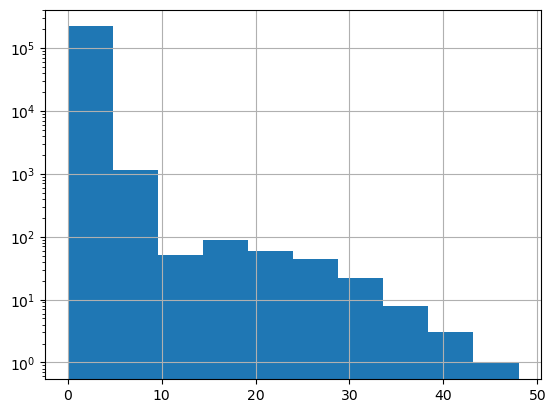

In [130]:
## Filter by chromosomes
#data_x = distribution[distribution.Chromosome == 'X']
#data_no_sex_chr = distribution[distribution.Chromosome != 'Y']
#data = data_no_sex_chr[data_no_sex_chr.Chromosome != 'X']

#data = data[data['GAUSSIAN-EVAL'] < 0.05]
data['RD'].hist(log=True)

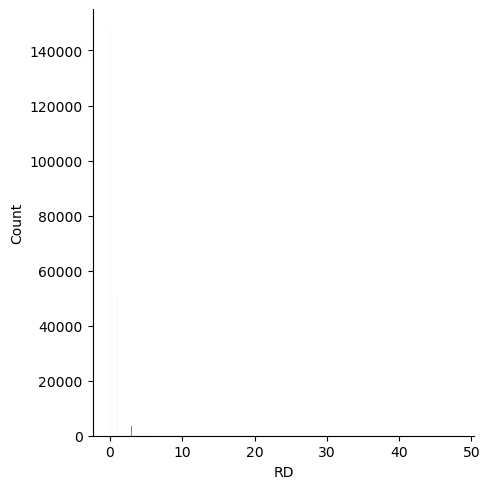

In [152]:
sns.displot(data['RD'])

NameError: name 'data_no_sex_chr' is not defined

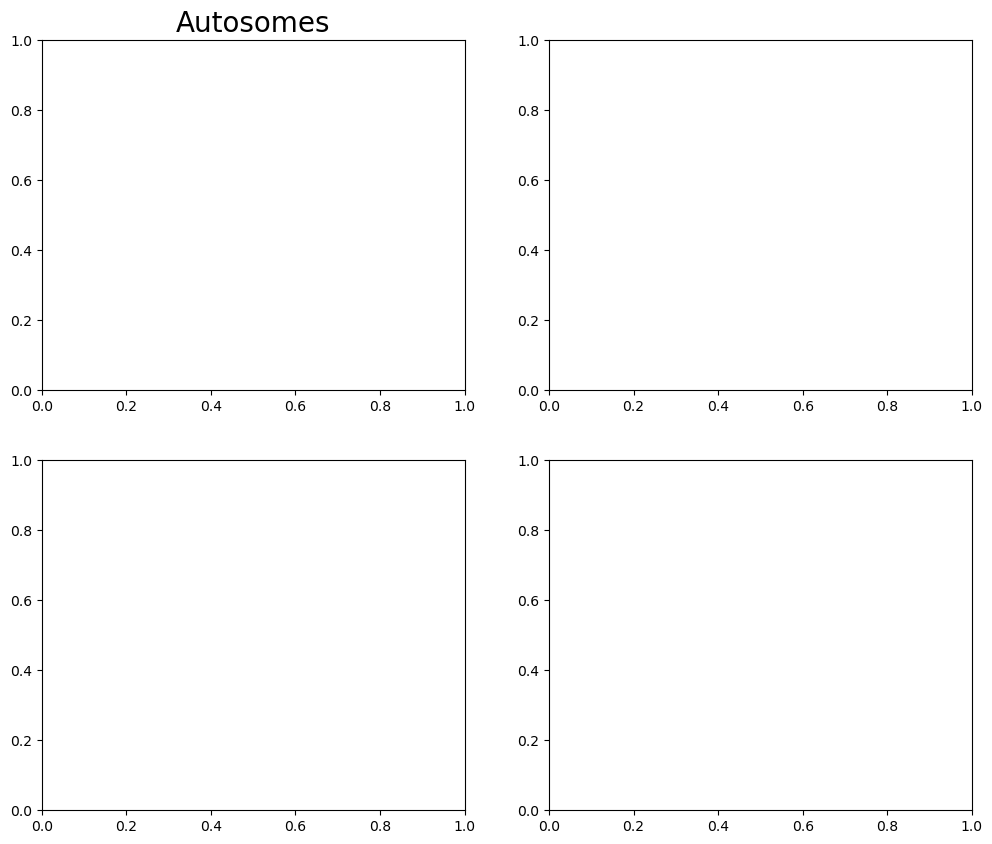

In [149]:
fig, axs = plt.subplots(2,2)
fig.set_size_inches(12, 10, forward=True)

axs[0, 0].set_title('Autosomes', size=20)

df = data_no_sex_chr.groupby(['RD'])['Lenght']

df.plot(kind='hist',stacked=True, bins=200, legend=True, ax=axs[0,0], xlabel='Size', alpha=0.5) # alpha for transparency
#plt.xlabel('Size')


df = data_no_sex_chr.groupby(['RD'])['Lenght']

df.plot(kind='hist',stacked=True, bins=200, logx=True, ax=axs[1,0], alpha=0.5) # alpha for transparency
#plt.xlabel('Size')


#fig.suptitle
axs[0, 1].set_title('Chr X', size=20)

df = data_x.groupby(['RD'])['Lenght']

df.plot(kind='hist',stacked=True, bins=100, ax=axs[0,1], alpha=0.5) # alpha for transparency

#plt.show()

df = data_x.groupby(['RD'])['Lenght']

df.plot(kind='hist',stacked=True, bins=100,logx=True, ax=axs[1,1], alpha=0.5) # alpha for transparency


fig.tight_layout() 
#plt.savefig('../plots/distribution.png', transparent=True)
plt.show()

In [150]:
## ADDING DUPLICATION/DELETION COLUMN 
deletions = data[data['RD'] < 2 ] 
deletions['Type'] = 'deletion'
duplications= data[data['RD'] > 2] 
duplications['Type'] = 'duplication'

frames = [deletions,duplications]

data = pd.concat(frames)
data


/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_30583/2847163872.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deletions['Type'] = 'deletion'
/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_30583/2847163872.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  duplications['Type'] = 'duplication'


,Chromosome,Start,End,CNVR,Sample_ID,CNV_Start,CNV_End,RD,Lenght,Type
1,1,449901.0,564900.0,CNVR_2,LP6005441-DNA_A01,471201,551200,0,80000.0,deletion
2,1,665601.0,843800.0,CNVR_3,LP6005441-DNA_A01,723801,728100,1,4300.0,deletion
3,1,1007801.0,1015200.0,CNVR_5,LP6005441-DNA_A01,1010901,1014200,0,3300.0,deletion
4,1,3995301.0,4237400.0,CNVR_15,LP6005441-DNA_A01,4124201,4127700,0,3500.0,deletion
5,1,13219701.0,13781900.0,CNVR_39,LP6005441-DNA_A01,13472301,13657600,0,185300.0,deletion
...,...,...,...,...,...,...,...,...,...,...
229139,7,56429901.0,56449500.0,CNVR_3723,SS6004480,56437901,56442400,15,4500.0,duplication
229141,7,56864301.0,56911300.0,CNVR_3728,SS6004480,56886501,56889100,4,2600.0,duplication
229258,9,66454701.0,66863300.0,CNVR_4607,SS6004480,66454701,66501200,3,46500.0,duplication
229267,9,67984701.0,68513900.0,CNVR_4608,SS6004480,68412001,68421300,6,9300.0,duplication


In [133]:
cnv = data.pivot_table(index=["Chromosome", "Start", "End", "Type"], 
                    columns='Sample_ID', 
                    values='RD').reset_index()
cnv = cnv.fillna(2)
cnv['Chromosome'] = 'chr' + cnv['Chromosome'].astype(str)
cnv['Start'] = cnv['Start'].astype(int)
cnv['End'] = cnv['Start'].astype(int)
#cnv.to_csv('../data/grch37_candidates_cnvr.csv', index=False)
coordinates = cnv.iloc[:,0:3]
coordinates.to_csv('../data/grch37_cnvr_coordinates.bed', sep='\t', header=False, index=False)
cnv

Sample_ID,Chromosome,Start,End,Type,LP6005441-DNA_A01,LP6005441-DNA_A03,LP6005441-DNA_A04,LP6005441-DNA_A05,LP6005441-DNA_A06,LP6005441-DNA_A08,...,SS6004471,SS6004472,SS6004473,SS6004474,SS6004475,SS6004476,SS6004477,SS6004478,SS6004479,SS6004480
0,chr1,176101,176101,deletion,2.0,0.0,0.0,1.0,1.0,0.5,...,1.0,0.25,1.0,0.5,0.5,2.0,0.0,0.0,1.0,1.0
1,chr1,449901,449901,deletion,0.0,0.5,0.0,0.0,0.0,0.0,...,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,chr1,665601,665601,deletion,1.0,2.0,2.0,2.0,2.0,2.0,...,1.0,1.00,1.0,1.0,1.0,1.0,1.0,1.0,2.0,2.0
3,chr1,665601,665601,duplication,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.00,3.0,2.0,3.0,3.0,2.0,3.0,2.0,2.0
4,chr1,891701,891701,deletion,2.0,2.0,2.0,2.0,2.0,2.0,...,0.0,0.00,2.0,2.0,2.0,0.0,2.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7835,chr9,140136301,140136301,deletion,2.0,2.0,2.0,2.0,2.0,2.0,...,1.0,2.00,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
7836,chr9,140197201,140197201,deletion,2.0,2.0,2.0,2.0,2.0,2.0,...,1.0,2.00,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
7837,chr9,140245301,140245301,deletion,0.0,0.0,0.0,0.0,0.0,2.0,...,1.0,0.00,2.0,0.0,0.0,0.0,2.0,2.0,0.0,0.0
7838,chr9,140387601,140387601,deletion,2.0,2.0,2.0,2.0,2.0,2.0,...,1.0,2.00,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0


In [134]:
coordinates = cnv.iloc[:,0:2]
cnvs = cnv.iloc[:,4:284]
cnvs = cnvs.T
cnvs = cnvs.fillna(2)
cnvs

,0,1,2,3,4,5,6,7,8,9,...,7830,7831,7832,7833,7834,7835,7836,7837,7838,7839
Sample_ID,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,2.0,0.0,1.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_A03,0.0,0.5,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_A04,0.0,0.0,2.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_A05,1.0,0.0,2.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_A06,1.0,0.0,2.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,2.0,0.0,1.0,3.0,0.0,0.0,0.0,2.0,2.0,2.0,...,0.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
SS6004477,0.0,0.0,1.0,2.0,2.0,1.0,0.0,2.0,1.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004478,0.0,0.0,1.0,3.0,0.0,2.0,0.0,2.0,2.0,2.0,...,0.0,2.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0,2.0


In [135]:
features = anotation.loc[:,["7-Gender","10-Region", "11-Country",]]
dt = features.merge(cnvs, left_index=True, right_index=True)
dt


,7-Gender,10-Region,11-Country,0,1,2,3,4,5,6,...,7830,7831,7832,7833,7834,7835,7836,7837,7838,7839
LP6005443-DNA_B06,F,WestEurasia,Iceland,0.0,0.0,2.0,2.0,2.0,0.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005442-DNA_D08,F,WestEurasia,Iceland,1.0,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_D07,F,SouthAsia,Pakistan,0.0,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005441-DNA_C07,M,SouthAsia,Pakistan,1.0,0.0,2.0,2.0,2.0,0.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005442-DNA_G11,M,Africa,SierraLeone,1.0,0.0,2.0,2.0,2.0,2.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,0.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LP6005441-DNA_H10,F,WestEurasia,Russia,0.0,0.0,1.0,2.0,2.0,0.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005519-DNA_A06,M,EastAsia,Myanmar,0.0,0.0,2.0,2.0,2.0,0.0,2.0,...,2.0,0.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0
LP6005519-DNA_B06,M,EastAsia,Myanmar,0.0,0.0,2.0,2.0,2.0,0.0,2.0,...,2.0,0.0,2.0,2.0,2.0,0.0,2.0,0.0,2.0,2.0
LP6005441-DNA_B08,F,Africa,Congo,0.5,0.0,2.0,2.0,2.0,0.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0


In [136]:
####### Groupby regions #######
dt_group = dt.groupby('10-Region')

dt_groupped = []
regions = anotation['10-Region'].unique()
for i in regions:
    dt_groupped.append(dt_group.get_group(str(i)))
    

#### Names to pair-population
regions = dt['10-Region'].unique()
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])
    

for j in dt_groupped:
    j.drop(columns=['10-Region', '11-Country', '7-Gender'], inplace=True)

/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_30583/3472590410.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  j.drop(columns=['10-Region', '11-Country', '7-Gender'], inplace=True)
/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_30583/3472590410.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  j.drop(columns=['10-Region', '11-Country', '7-Gender'], inplace=True)
/var/folders/05/4pfxtbrs5459ytz3j1jhcgt00000gn/T/ipykernel_30583/3472590410.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.

In [137]:

dt_groupped

[                   0     1     2     3     4     5     6     7     8     9     \
 LP6005443-DNA_B06   0.0   0.0   2.0   2.0   2.0   0.0   2.0   2.0   2.0   2.0   
 LP6005442-DNA_D08   1.0   0.0   2.0   2.0   2.0   2.0   2.0   2.0   2.0   2.0   
 LP6005442-DNA_C02   1.0   0.0   2.0   2.0   2.0   0.0   2.0   2.0   2.0   2.0   
 LP6005442-DNA_D02   1.0   0.0   1.0   2.0   2.0   2.0   2.0   2.0   2.0   2.0   
 LP6005442-DNA_F04   0.5   0.0   2.0   2.0   2.0   0.0   2.0   2.0   2.0   2.0   
 ...                 ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
 LP6005443-DNA_A06   0.5   0.0   2.0   2.0   2.0   0.0   2.0   2.0   2.0   2.0   
 LP6005441-DNA_H12   1.0   0.0   2.0   2.0   2.0   0.0   2.0   2.0   2.0   2.0   
 LP6005441-DNA_G10   1.0   0.0   2.0   2.0   2.0   0.0   2.0   2.0   2.0   2.0   
 LP6005441-DNA_H10   0.0   0.0   1.0   2.0   2.0   0.0   2.0   2.0   2.0   2.0   
 LP6005592-DNA_G01   1.0   0.0   2.0   2.0   2.0   0.0   2.0   2.0   2.0   2.0   
 
              

In [162]:
## VST for pair-population
vst_dt = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2))
for region in combination_regions:
        statistic = vst_function((dt_groupped[region[0]]), (dt_groupped[region[1]]))
        vst_dt.append(statistic)

vst_dt = pd.DataFrame(vst_dt).set_axis(combination_names)
#vst_dt = vst_dt.T
vst_dt


,0,1,2,3,4,5,6,7,8,9,...,7830,7831,7832,7833,7834,7835,7836,7837,7838,7839
WestEurasia-SouthAsia,0.001854,0.012475,0.000381,NaN,0.019340,0.000166,0.007902,0.004706,NaN,0.001912,...,0.013282,1.349210e-02,NaN,0.004706,1.437346e-02,0.005712,NaN,0.003648,0.009496,0.009496
WestEurasia-Africa,0.000306,0.005082,0.000665,2.899687e-02,0.000836,0.004863,0.013093,0.005082,0.014375,0.005082,...,0.004969,2.170727e-03,0.014375,0.001191,1.391577e-04,0.008995,0.014375,0.176242,0.019555,0.000174
WestEurasia-CentralAsiaSiberia,0.003654,0.003649,0.044668,NaN,0.001405,0.014167,0.003267,0.003649,NaN,0.003649,...,0.010319,4.012436e-02,NaN,0.003649,1.116933e-02,0.005890,NaN,0.002047,0.007371,0.007371
WestEurasia-Oceania,0.031569,0.007332,0.003019,3.178694e-02,0.002758,0.000936,0.008136,0.003344,0.031787,0.007332,...,0.000360,1.788458e-02,NaN,0.003344,5.990033e-06,0.004331,NaN,0.001975,0.006757,0.006757
WestEurasia-America,0.001734,0.003129,0.001814,3.540670e-02,0.004095,0.035348,0.001424,0.003129,NaN,0.003129,...,0.013701,1.215486e-02,NaN,0.003129,1.068262e-04,0.019820,NaN,0.001069,0.011864,0.006325
WestEurasia-EastAsia,0.011619,0.000976,0.000920,2.726603e-02,0.000536,0.000002,0.001281,0.005224,NaN,0.005224,...,0.001307,1.404390e-02,NaN,0.005224,2.593298e-03,0.002165,0.013518,0.025601,0.010536,0.010536
SouthAsia-Africa,0.004616,0.027857,0.000048,2.188552e-02,0.033239,0.003566,0.039544,NaN,0.010809,0.013759,...,0.032678,5.730907e-03,0.010809,0.010809,2.188552e-02,0.031898,0.010809,0.205930,0.030691,0.010809
SouthAsia-CentralAsiaSiberia,0.012278,0.021635,0.054026,NaN,0.045139,0.015385,0.001068,NaN,NaN,0.010651,...,NaN,1.235043e-02,NaN,NaN,NaN,0.024311,NaN,0.012934,NaN,NaN
SouthAsia-Oceania,0.024686,0.000481,0.006838,2.620968e-02,0.053279,0.000473,0.039154,NaN,0.026210,0.001970,...,0.026210,1.229589e-03,NaN,NaN,2.620968e-02,0.020496,NaN,0.000133,NaN,NaN
SouthAsia-America,0.007558,0.019122,0.000897,2.954545e-02,0.060092,0.046742,0.021006,NaN,NaN,0.009402,...,0.060092,9.972202e-05,NaN,NaN,2.954545e-02,0.050366,NaN,0.000599,0.029545,NaN


In [163]:
filtering_vst = pd.DataFrame(vst_dt)>=0.2
filtering_vst = filtering_vst.loc[:, filtering_vst.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_vst



,29,30,44,67,169,170,171,202,211,228,...,7782,7784,7790,7812,7813,7818,7822,7825,7826,7837
WestEurasia-SouthAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-Africa,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,True,False,False,False,False
WestEurasia-CentralAsiaSiberia,True,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-Oceania,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,True,False,False,False,False
WestEurasia-America,True,True,False,False,True,False,True,False,False,True,...,False,False,False,False,True,False,False,False,False,False
WestEurasia-EastAsia,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,True,False,False,False,False
SouthAsia-Africa,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,False,True,True
SouthAsia-CentralAsiaSiberia,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
SouthAsia-Oceania,False,False,False,True,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
SouthAsia-America,True,False,False,False,True,False,False,False,False,True,...,False,False,False,False,True,False,False,False,False,False


In [164]:
## Coordinates anotation 
vst_dt = vst_dt.T
vst_dt.insert (0, 'Chromosome', cnv['Chromosome'])
vst_dt.insert (1, 'Start', cnv['Start'])
vst_dt.insert (2, 'End', cnv['End'])
#vst_dt.insert (3, 'type', cnv['Type'])
vst_dt = vst_dt.round(5)
vst_dt = vst_dt.replace(np.NaN, 0)
vst_dt

,Chromosome,Start,End,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
0,chr1,176101,176101,0.00185,0.00031,0.00365,0.03157,0.00173,0.01162,0.00462,...,0.00296,0.04847,0.00113,0.01980,0.05891,0.00023,0.03052,0.04620,0.01144,0.02116
1,chr1,449901,449901,0.01248,0.00508,0.00365,0.00733,0.00313,0.00098,0.02786,...,0.00000,0.02736,0.00000,0.01075,0.02250,0.00000,0.00815,0.02037,0.00322,0.00714
2,chr1,665601,665601,0.00038,0.00067,0.04467,0.00302,0.00181,0.00092,0.00005,...,0.04104,0.00687,0.00047,0.00301,0.10623,0.03556,0.06225,0.01140,0.00078,0.00500
3,chr1,665601,665601,0.00000,0.02900,0.00000,0.03179,0.03541,0.02727,0.02189,...,0.01779,0.00008,-0.00000,0.00002,0.02250,0.02557,0.01653,0.00009,0.00002,0.00002
4,chr1,891701,891701,0.01934,0.00084,0.00140,0.00276,0.00410,0.00054,0.03324,...,0.00012,0.00077,0.00164,0.00004,0.00030,0.00094,0.00029,0.00018,0.00111,0.00212
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7835,chr9,140136301,140136301,0.00571,0.00900,0.00589,0.00433,0.01982,0.00216,0.03190,...,0.00007,0.00041,0.01402,0.02165,0.00014,0.01698,0.01586,0.02037,0.01292,0.03796
7836,chr9,140197201,140197201,0.00000,0.01437,0.00000,0.00000,0.00000,0.01352,0.01081,...,0.00877,0.00814,0.00769,0.00001,0.00000,0.00000,0.00815,0.00000,0.00756,0.00714
7837,chr9,140245301,140245301,0.00365,0.17624,0.00205,0.00197,0.00107,0.02560,0.20593,...,0.12055,0.16862,0.15589,0.28916,0.01008,0.00754,0.05315,0.00018,0.01708,0.02080
7838,chr9,140387601,140387601,0.00950,0.01955,0.00737,0.00676,0.01186,0.01054,0.03069,...,0.02499,0.02323,0.00062,0.03329,0.00000,0.02557,0.00000,0.02424,0.00000,0.03121


In [165]:
vst_dt.to_csv('../data/vst_results_grch37.csv', index=False)

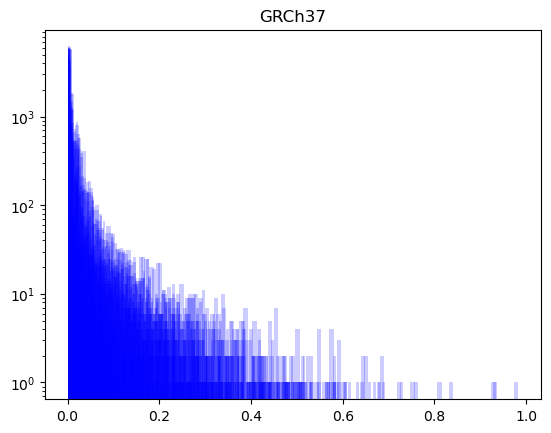

In [141]:
#sns.set_palette("bright")
for i in vst_dt.iloc[:,3:25].columns:
    plt.hist(vst_dt[i], bins=100, alpha=0.2, log=True, color="blue")
    plt.title('GRCh37')

/Users/luciabazan/anaconda3/lib/python3.11/site-packages/pandas/plotting/_matplotlib/tools.py:227: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(**fig_kw)


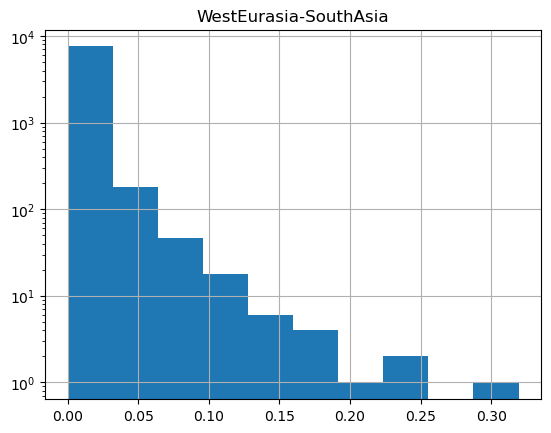

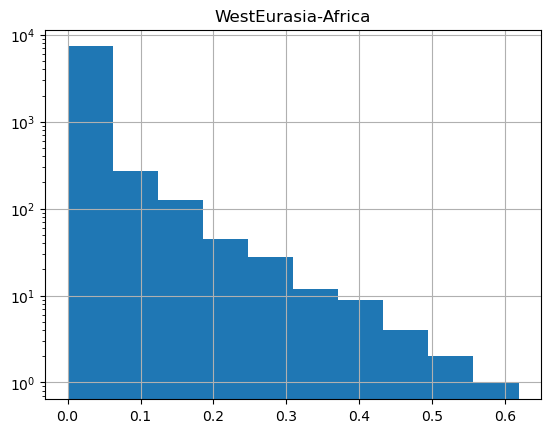

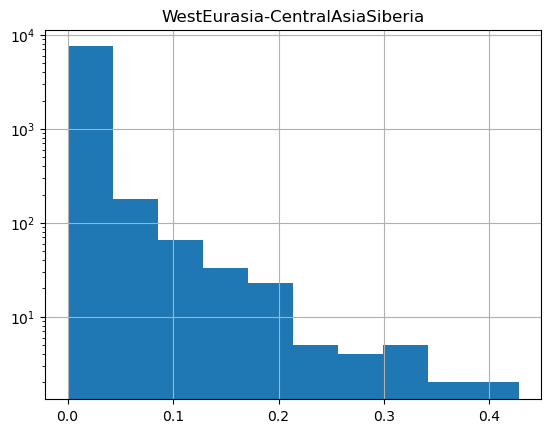

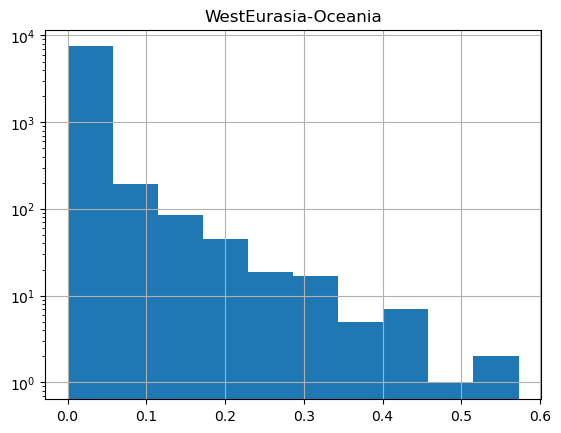

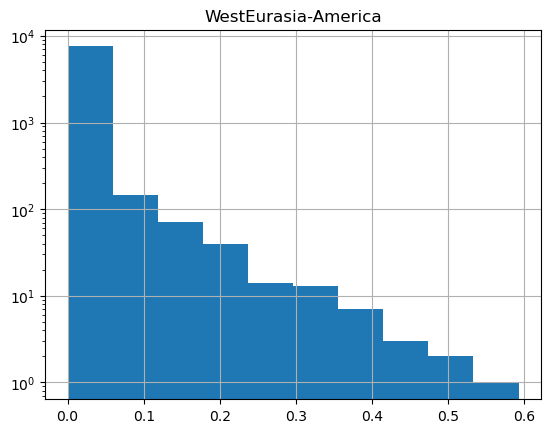

...

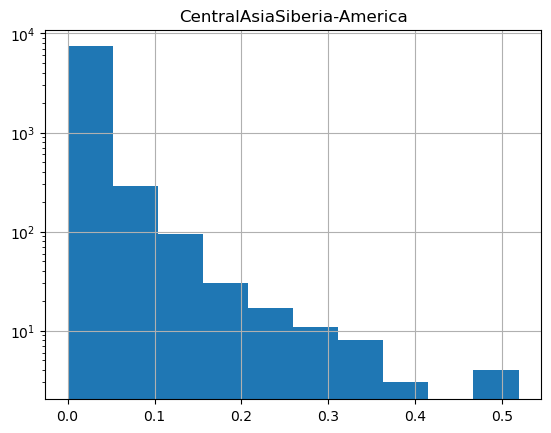

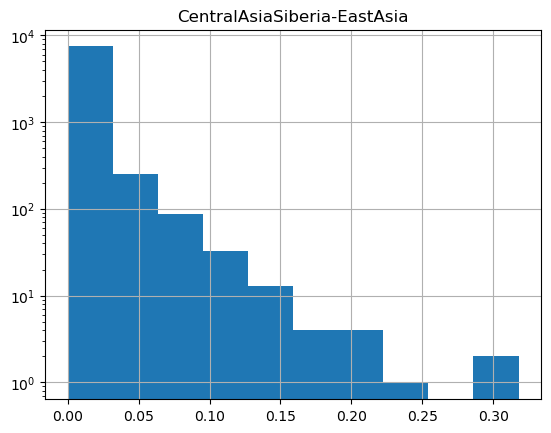

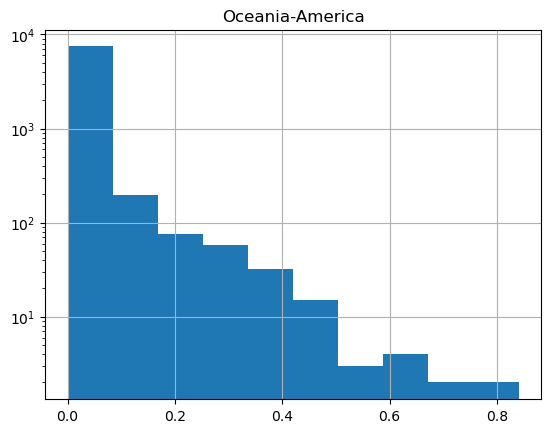

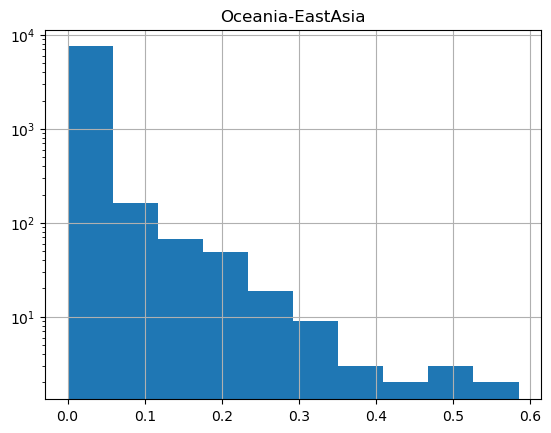

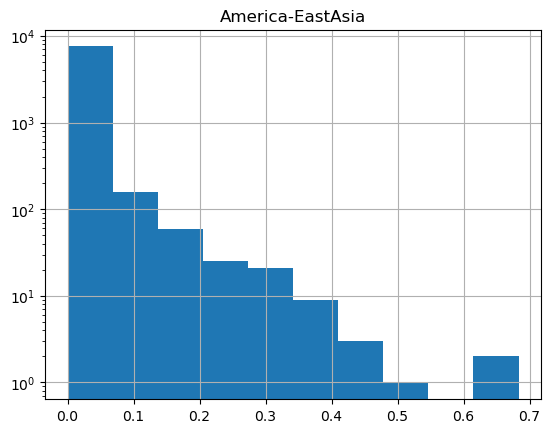

In [142]:
for col in vst_dt.iloc[:,3:25].columns: 
    try:      
        vst_dt.iloc[:,3:25][col] = pd.to_numeric(vst_dt.iloc[:,3:25][col]) 
        vst_dt.iloc[:,3:25].hist(column=col, log=True)
    except ValueError:
        print('This column can not be represented as a histogram')

<Axes: >

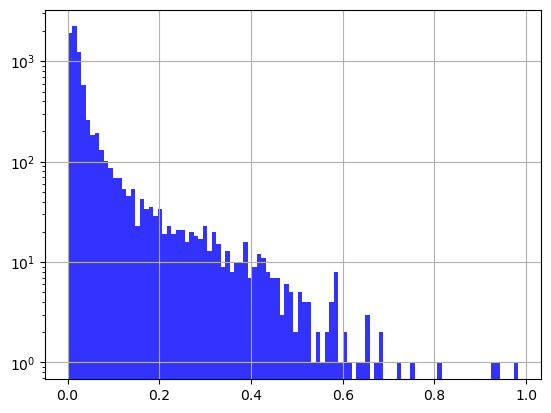

In [159]:
vst_dt.iloc[:,3:25].max(axis=1).hist(bins=100, alpha=0.8, log=True, color="blue")

In [143]:
chr8 = vst_dt[vst_dt['chr'] == '8']
chr8[chr8['start'] > 22700000].sort_values(by='start', ascending=True).head(50)

,chr,start,end,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia


In [144]:
vst_dt_filtering_location = vst_dt.iloc[filtering_vst.columns]
vst_dt_filtering_location#[vst_dt_filtering_location['chr'] == '8'].sort_values(by='WestEurasia-Oceania', ascending=False).head(50)

,chr,start,end,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
29,chr1,8360201,8360201,0.00000,0.00000,0.23576,0.00000,0.39112,0.00000,0.00000,...,0.20694,0.00000,0.35714,0.00000,0.16537,0.02666,0.20969,0.30303,0.00000,0.36050
30,chr1,9846201,9846201,0.07167,0.01025,0.01140,0.00134,0.25416,0.02870,0.10391,...,0.04724,0.02736,0.31579,0.05627,0.00473,0.15949,0.00322,0.19800,0.01292,0.12079
44,chr1,16150401,16150401,0.00041,0.08380,0.13144,0.03128,0.02458,0.12031,0.10320,...,0.01514,0.22571,0.01291,0.00405,0.36782,0.06077,0.00396,0.15333,0.28087,0.03045
67,chr1,24377601,24377601,0.00854,0.15839,0.02047,0.13059,0.12174,0.01070,0.13545,...,0.10554,0.65039,0.00769,0.27255,0.32327,0.11370,0.06462,0.64506,0.09120,0.22873
169,chr1,62113301,62113301,0.01813,0.02305,0.07596,0.01532,0.21904,0.01040,0.00028,...,0.20023,0.09094,0.42187,0.06680,0.02488,0.05635,0.03559,0.15222,0.00108,0.16199
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7818,chr9,131183401,131183401,0.04238,0.20507,0.04905,0.26372,0.10135,0.25317,0.07324,...,0.05986,0.00249,0.02334,0.00471,0.09642,0.01010,0.08929,0.04593,0.00025,0.04388
7822,chr9,134074401,134074401,0.00000,0.00135,0.00000,0.04823,0.17814,0.00046,0.00126,...,0.00112,0.06377,0.20562,0.00306,0.04748,0.17758,0.00040,0.04569,0.03870,0.15935
7825,chr9,136453701,136453701,0.02369,0.07091,0.03114,0.03487,0.05146,0.03490,0.18753,...,0.21297,0.00343,0.26493,0.21177,0.16925,0.00605,0.00007,0.23142,0.14903,0.00646
7826,chr9,137097701,137097701,0.00910,0.14457,0.00573,0.09906,0.05858,0.01582,0.25019,...,0.12100,0.54740,0.01683,0.08765,0.19579,0.04640,0.00178,0.40409,0.21460,0.02621


In [145]:
vst_dt_filtered = vst_dt.iloc[filtering_vst.T.index]
vst_dt_filtered 

,chr,start,end,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
29,chr1,8360201,8360201,0.00000,0.00000,0.23576,0.00000,0.39112,0.00000,0.00000,...,0.20694,0.00000,0.35714,0.00000,0.16537,0.02666,0.20969,0.30303,0.00000,0.36050
30,chr1,9846201,9846201,0.07167,0.01025,0.01140,0.00134,0.25416,0.02870,0.10391,...,0.04724,0.02736,0.31579,0.05627,0.00473,0.15949,0.00322,0.19800,0.01292,0.12079
44,chr1,16150401,16150401,0.00041,0.08380,0.13144,0.03128,0.02458,0.12031,0.10320,...,0.01514,0.22571,0.01291,0.00405,0.36782,0.06077,0.00396,0.15333,0.28087,0.03045
67,chr1,24377601,24377601,0.00854,0.15839,0.02047,0.13059,0.12174,0.01070,0.13545,...,0.10554,0.65039,0.00769,0.27255,0.32327,0.11370,0.06462,0.64506,0.09120,0.22873
169,chr1,62113301,62113301,0.01813,0.02305,0.07596,0.01532,0.21904,0.01040,0.00028,...,0.20023,0.09094,0.42187,0.06680,0.02488,0.05635,0.03559,0.15222,0.00108,0.16199
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7818,chr9,131183401,131183401,0.04238,0.20507,0.04905,0.26372,0.10135,0.25317,0.07324,...,0.05986,0.00249,0.02334,0.00471,0.09642,0.01010,0.08929,0.04593,0.00025,0.04388
7822,chr9,134074401,134074401,0.00000,0.00135,0.00000,0.04823,0.17814,0.00046,0.00126,...,0.00112,0.06377,0.20562,0.00306,0.04748,0.17758,0.00040,0.04569,0.03870,0.15935
7825,chr9,136453701,136453701,0.02369,0.07091,0.03114,0.03487,0.05146,0.03490,0.18753,...,0.21297,0.00343,0.26493,0.21177,0.16925,0.00605,0.00007,0.23142,0.14903,0.00646
7826,chr9,137097701,137097701,0.00910,0.14457,0.00573,0.09906,0.05858,0.01582,0.25019,...,0.12100,0.54740,0.01683,0.08765,0.19579,0.04640,0.00178,0.40409,0.21460,0.02621


In [146]:
## Saving Vst coordinates as bed file to liftover

vst_dt_filtered.iloc[:,0:3].to_csv('vst_coordinates_grch37.bed', header=False, index=False,sep='\t')

In [147]:
vst_dt_filtered.iloc[:,0:3]

,chr,start,end
29,chr1,8360201,8360201
30,chr1,9846201,9846201
44,chr1,16150401,16150401
67,chr1,24377601,24377601
169,chr1,62113301,62113301
...,...,...,...
7818,chr9,131183401,131183401
7822,chr9,134074401,134074401
7825,chr9,136453701,136453701
7826,chr9,137097701,137097701


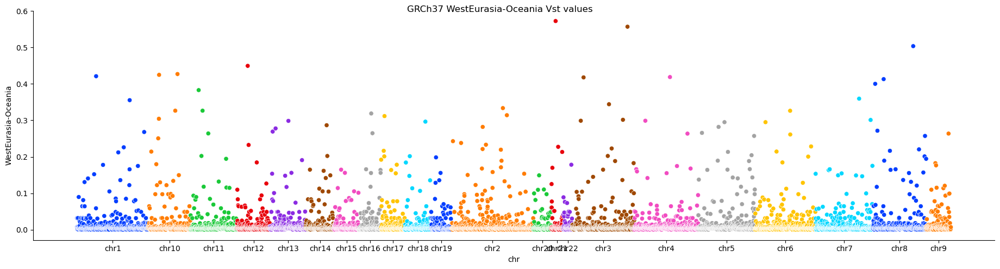

In [95]:
# Simulate DataFrame
#vst_dt['i']= vst_dt.index
vst_dt["i"] = pd.to_numeric(vst_dt.index, downcast="float")

#vst_dt['log_West_Oceania'] = np.log2(vst_dt['WestEurasia-Oceania'])

# Generate Manhattan plot: (#optional tweaks for relplot: linewidth=0, s=9)
plot = sns.relplot(data=vst_dt, x='i', y='WestEurasia-Oceania', aspect=3.7, 
                  hue='chr', palette = 'bright', legend=None) 
chrom_df=vst_dt.groupby('chr')['i'].median()
plot.ax.set_xlabel('chr'); plot.ax.set_xticks(chrom_df);
plot.ax.set_xticklabels(chrom_df.index)
plot.fig.suptitle('GRCh37 WestEurasia-Oceania Vst values');

<h1> Computing permutation 

In [97]:
from stattools.resampling import PermutationTest
PermutationTest

stattools.resampling.permutation.PermutationTest

In [98]:
print("Starting permutation")
### Grouping again 
cnvs_passed_vst = cnvs.T.iloc[filtering_vst.T.index]
cnvs_passed_vst = cnvs_passed_vst.T

dt_cnvs_passed_vst = features.merge(cnvs_passed_vst, left_index=True, right_index=True)
dt_cnvs_passed_vst.head()


Starting permutation


,7-Gender,10-Region,11-Country,29,30,44,67,169,170,171,...,7782,7784,7790,7812,7813,7818,7822,7825,7826,7837
LP6005443-DNA_B06,F,WestEurasia,Iceland,2.0,2.0,2.0,0.0,2.0,2.0,0.0,...,2.0,2.0,0.0,2.0,2.0,0.0,2.0,0.0,0.0,0.0
LP6005442-DNA_D08,F,WestEurasia,Iceland,2.0,2.0,0.0,0.0,2.0,2.0,2.0,...,0.0,2.0,0.0,0.0,2.0,0.0,2.0,2.0,0.0,0.0
LP6005441-DNA_D07,F,SouthAsia,Pakistan,2.0,2.0,0.0,2.0,2.0,2.0,2.0,...,0.0,2.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
LP6005441-DNA_C07,M,SouthAsia,Pakistan,2.0,2.0,0.0,2.0,2.0,0.0,2.0,...,2.0,0.0,0.0,0.0,2.0,0.0,2.0,0.0,2.0,0.0
LP6005442-DNA_G11,M,Africa,SierraLeone,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0,0.0,0.0


In [99]:
####### Groupby regions #######
dt_group = dt_cnvs_passed_vst.groupby('10-Region')

dt_groupped = []
regions = features['10-Region'].unique()
for i in regions:
    dt_groupped.append(dt_group.get_group(str(i)))
    

#### Names to pair-population
regions = dt['10-Region'].unique()
combination_names = []
for i in list(combinations(regions,2)):
    combination_names.append(i[0]+str('-')+i[1])
    
dt_groupped[region[0]]

,7-Gender,10-Region,11-Country,29,30,44,67,169,170,171,...,7782,7784,7790,7812,7813,7818,7822,7825,7826,7837
LP6005443-DNA_G11,M,America,Mexico,2.0,0.0,2.0,2.0,0.0,2.0,0.0,...,2.0,2.0,2.0,2.0,0.0,2.0,0.0,0.0,0.0,0.0
LP6005443-DNA_H11,F,America,Mexico,0.0,0.0,0.0,2.0,0.0,2.0,0.0,...,2.0,2.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0
SS6004479,F,America,Mexico,0.0,2.0,2.0,2.0,0.0,2.0,2.0,...,0.0,2.0,2.0,0.0,0.0,2.0,2.0,0.0,0.0,0.0
LP6005441-DNA_F10,F,America,Mexico,2.0,0.0,0.0,2.0,2.0,2.0,2.0,...,2.0,2.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0
LP6005441-DNA_E10,M,America,Mexico,2.0,0.0,0.0,2.0,0.0,0.0,2.0,...,0.0,2.0,0.5,2.0,0.0,0.0,2.0,0.0,0.0,0.0
LP6005519-DNA_D01,M,America,Argentina,0.0,2.0,0.0,2.0,2.0,2.0,0.0,...,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
SS6004476,M,America,Brazil,0.0,2.0,0.0,2.0,0.0,2.0,2.0,...,0.0,2.0,2.0,2.0,0.0,0.0,0.0,2.0,0.5,0.0
LP6005443-DNA_E11,F,America,Mexico,2.0,2.0,0.0,2.0,0.0,2.0,0.0,...,0.0,2.0,1.0,2.0,0.0,2.0,2.0,2.0,0.0,0.0
LP6005443-DNA_F11,F,America,Mexico,0.0,0.0,2.0,2.0,0.0,0.0,2.0,...,2.0,2.0,2.0,0.0,0.0,2.0,0.0,2.0,2.0,0.0
LP6005677-DNA_D01,M,America,Mexico,0.0,2.0,0.0,2.0,0.0,0.0,2.0,...,0.0,2.0,2.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0


In [103]:
p_value_permutation = []

combination_regions = list(combinations([0,1,2,3,4,5,6],2)) 
for region in combination_regions:
    p_value= []
    p_value_permutation.append(p_value)
    
    for i in cnvs_passed_vst.columns:
        permutation = PermutationTest(dt_groupped[region[0]][i], dt_groupped[region[1]][i], stat=vst_function, n_perm=9999)#mean_gt
        p_value.append(permutation.p_value())

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/vst_function.py:31: RuntimeWarning: invalid value encountered in scalar divide
  vst = (vt-vs)/vt


In [104]:
results_permutation = pd.DataFrame(p_value_permutation).set_axis(combination_names)
results_permutation

,0,1,2,3,4,5,6,7,8,9,...,447,448,449,450,451,452,453,454,455,456
WestEurasia-SouthAsia,0.0001,0.0038,0.7842,0.3316,0.1534,0.2044,0.1711,0.3292,0.3617,0.8167,...,0.1662,0.6138,0.4033,0.5061,0.5442,0.0435,0.9924,0.1149,0.3245,0.5457
WestEurasia-Africa,0.0001,0.4726,0.0024,0.0002,0.1653,0.0088,0.9960,0.0001,0.3261,0.0081,...,0.0034,0.0003,0.1134,0.0007,0.0001,0.0001,0.6575,0.0049,0.0001,0.0001
WestEurasia-CentralAsiaSiberia,0.0001,0.5151,0.0001,0.1570,0.0081,1.0000,0.0001,0.2397,0.6956,0.2941,...,0.0001,0.2730,0.3225,0.0005,0.0074,0.0556,0.8942,0.0922,0.4640,0.6760
WestEurasia-Oceania,0.0001,0.9951,0.0959,0.0004,0.2450,0.0178,0.0001,0.4104,0.4861,0.3422,...,0.0814,0.0006,0.0021,0.3141,0.0167,0.0001,0.0350,0.0675,0.0016,0.5327
WestEurasia-America,0.0001,0.0001,0.1430,0.0004,0.0001,0.0067,0.0001,0.9970,0.0393,0.0001,...,0.0298,0.2373,0.1838,0.4093,0.0001,0.0079,0.0001,0.0286,0.0164,0.9242
WestEurasia-EastAsia,0.0001,0.0649,0.0003,0.2794,0.3554,0.0031,0.0001,0.2568,0.2948,0.0139,...,0.0001,0.9622,0.7512,0.0021,0.9287,0.0001,0.7807,0.0456,0.1731,0.0998
SouthAsia-Africa,0.0001,0.0025,0.0039,0.0008,0.9459,0.1654,0.1683,0.0014,0.0001,0.0474,...,0.0002,0.0272,0.0238,0.0001,0.0001,0.0160,0.7651,0.0002,0.0001,0.0001
SouthAsia-CentralAsiaSiberia,0.0002,0.2032,0.0005,0.6964,0.0001,0.2374,0.0008,0.2242,0.1364,0.4253,...,0.0360,0.0826,0.8696,0.0027,0.0684,0.7736,0.9667,0.6647,0.2109,0.2671
SouthAsia-Oceania,0.0001,0.0684,0.1009,0.0004,0.0308,0.1207,0.0001,0.2418,0.0001,0.3955,...,0.6060,0.0397,0.0399,0.1106,0.0184,0.0085,0.0587,0.0042,0.0387,0.9377
SouthAsia-America,0.0001,0.0402,0.1249,0.0114,0.0001,0.0013,0.0007,0.8950,0.0003,0.0001,...,0.3594,0.2883,0.0497,0.8368,0.0001,0.4429,0.0007,0.5176,0.0052,0.8538


<h2> Just CNvs that passed permutation 

In [105]:
permutation_pased__vst_chm13 = pd.DataFrame(p_value_permutation).set_axis(combination_names)
# create a process pool that uses all cpus
permutation_pased__vst_chm13.to_csv('../data/permutation_passed_vst_cnvr_grch37.csv')
permutation_pased__vst_chm13

,0,1,2,3,4,5,6,7,8,9,...,447,448,449,450,451,452,453,454,455,456
WestEurasia-SouthAsia,0.0001,0.0038,0.7842,0.3316,0.1534,0.2044,0.1711,0.3292,0.3617,0.8167,...,0.1662,0.6138,0.4033,0.5061,0.5442,0.0435,0.9924,0.1149,0.3245,0.5457
WestEurasia-Africa,0.0001,0.4726,0.0024,0.0002,0.1653,0.0088,0.9960,0.0001,0.3261,0.0081,...,0.0034,0.0003,0.1134,0.0007,0.0001,0.0001,0.6575,0.0049,0.0001,0.0001
WestEurasia-CentralAsiaSiberia,0.0001,0.5151,0.0001,0.1570,0.0081,1.0000,0.0001,0.2397,0.6956,0.2941,...,0.0001,0.2730,0.3225,0.0005,0.0074,0.0556,0.8942,0.0922,0.4640,0.6760
WestEurasia-Oceania,0.0001,0.9951,0.0959,0.0004,0.2450,0.0178,0.0001,0.4104,0.4861,0.3422,...,0.0814,0.0006,0.0021,0.3141,0.0167,0.0001,0.0350,0.0675,0.0016,0.5327
WestEurasia-America,0.0001,0.0001,0.1430,0.0004,0.0001,0.0067,0.0001,0.9970,0.0393,0.0001,...,0.0298,0.2373,0.1838,0.4093,0.0001,0.0079,0.0001,0.0286,0.0164,0.9242
WestEurasia-EastAsia,0.0001,0.0649,0.0003,0.2794,0.3554,0.0031,0.0001,0.2568,0.2948,0.0139,...,0.0001,0.9622,0.7512,0.0021,0.9287,0.0001,0.7807,0.0456,0.1731,0.0998
SouthAsia-Africa,0.0001,0.0025,0.0039,0.0008,0.9459,0.1654,0.1683,0.0014,0.0001,0.0474,...,0.0002,0.0272,0.0238,0.0001,0.0001,0.0160,0.7651,0.0002,0.0001,0.0001
SouthAsia-CentralAsiaSiberia,0.0002,0.2032,0.0005,0.6964,0.0001,0.2374,0.0008,0.2242,0.1364,0.4253,...,0.0360,0.0826,0.8696,0.0027,0.0684,0.7736,0.9667,0.6647,0.2109,0.2671
SouthAsia-Oceania,0.0001,0.0684,0.1009,0.0004,0.0308,0.1207,0.0001,0.2418,0.0001,0.3955,...,0.6060,0.0397,0.0399,0.1106,0.0184,0.0085,0.0587,0.0042,0.0387,0.9377
SouthAsia-America,0.0001,0.0402,0.1249,0.0114,0.0001,0.0013,0.0007,0.8950,0.0003,0.0001,...,0.3594,0.2883,0.0497,0.8368,0.0001,0.4429,0.0007,0.5176,0.0052,0.8538


<h2> CNVs that passed permutation and vst  

In [106]:
results_permutation = pd.read_csv('../data/permutation_passed_vst_cnvr_grch37.csv', index_col=0)
results_permutation

,0,1,2,3,4,5,6,7,8,9,...,447,448,449,450,451,452,453,454,455,456
WestEurasia-SouthAsia,0.0001,0.0038,0.7842,0.3316,0.1534,0.2044,0.1711,0.3292,0.3617,0.8167,...,0.1662,0.6138,0.4033,0.5061,0.5442,0.0435,0.9924,0.1149,0.3245,0.5457
WestEurasia-Africa,0.0001,0.4726,0.0024,0.0002,0.1653,0.0088,0.9960,0.0001,0.3261,0.0081,...,0.0034,0.0003,0.1134,0.0007,0.0001,0.0001,0.6575,0.0049,0.0001,0.0001
WestEurasia-CentralAsiaSiberia,0.0001,0.5151,0.0001,0.1570,0.0081,1.0000,0.0001,0.2397,0.6956,0.2941,...,0.0001,0.2730,0.3225,0.0005,0.0074,0.0556,0.8942,0.0922,0.4640,0.6760
WestEurasia-Oceania,0.0001,0.9951,0.0959,0.0004,0.2450,0.0178,0.0001,0.4104,0.4861,0.3422,...,0.0814,0.0006,0.0021,0.3141,0.0167,0.0001,0.0350,0.0675,0.0016,0.5327
WestEurasia-America,0.0001,0.0001,0.1430,0.0004,0.0001,0.0067,0.0001,0.9970,0.0393,0.0001,...,0.0298,0.2373,0.1838,0.4093,0.0001,0.0079,0.0001,0.0286,0.0164,0.9242
WestEurasia-EastAsia,0.0001,0.0649,0.0003,0.2794,0.3554,0.0031,0.0001,0.2568,0.2948,0.0139,...,0.0001,0.9622,0.7512,0.0021,0.9287,0.0001,0.7807,0.0456,0.1731,0.0998
SouthAsia-Africa,0.0001,0.0025,0.0039,0.0008,0.9459,0.1654,0.1683,0.0014,0.0001,0.0474,...,0.0002,0.0272,0.0238,0.0001,0.0001,0.0160,0.7651,0.0002,0.0001,0.0001
SouthAsia-CentralAsiaSiberia,0.0002,0.2032,0.0005,0.6964,0.0001,0.2374,0.0008,0.2242,0.1364,0.4253,...,0.0360,0.0826,0.8696,0.0027,0.0684,0.7736,0.9667,0.6647,0.2109,0.2671
SouthAsia-Oceania,0.0001,0.0684,0.1009,0.0004,0.0308,0.1207,0.0001,0.2418,0.0001,0.3955,...,0.6060,0.0397,0.0399,0.1106,0.0184,0.0085,0.0587,0.0042,0.0387,0.9377
SouthAsia-America,0.0001,0.0402,0.1249,0.0114,0.0001,0.0013,0.0007,0.8950,0.0003,0.0001,...,0.3594,0.2883,0.0497,0.8368,0.0001,0.4429,0.0007,0.5176,0.0052,0.8538


In [107]:
vst_dt_filtered = vst_dt.iloc[filtering_vst.T.index]
vst_dt_filtered = vst_dt_filtered.reset_index()
vst_dt_sb = vst_dt_filtered.drop(columns=['chr', 'start','end', 'index'])
vst_dt_sb.describe()



,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,SouthAsia-CentralAsiaSiberia,SouthAsia-Oceania,SouthAsia-America,...,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia,i
count,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,...,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000,457.000000
mean,0.023258,0.104920,0.053483,0.092924,0.083521,0.074909,0.106372,0.048328,0.088086,0.089233,...,0.145125,0.164703,0.141946,0.106817,0.075839,0.030484,0.156440,0.081667,0.084019,3937.168490
std,0.035955,0.112018,0.072447,0.106502,0.102173,0.097751,0.108235,0.060841,0.096166,0.110319,...,0.150287,0.154359,0.138965,0.117336,0.092319,0.043130,0.150556,0.100669,0.106333,2258.249936
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,29.000000
25%,0.002580,0.014330,0.005340,0.012010,0.007500,0.007650,0.016110,0.004520,0.012820,0.009400,...,0.018970,0.032260,0.024780,0.016200,0.010100,0.002290,0.023430,0.007560,0.007720,2173.000000
50%,0.010150,0.064190,0.023300,0.046610,0.039480,0.033430,0.070870,0.026600,0.056360,0.049750,...,0.104520,0.133900,0.102550,0.062500,0.042370,0.013320,0.126160,0.039930,0.037960,3841.000000
75%,0.028880,0.159210,0.073840,0.150050,0.128670,0.111570,0.175540,0.066110,0.130180,0.132020,...,0.225940,0.255210,0.221940,0.165370,0.110550,0.038460,0.254290,0.126820,0.126480,5882.000000
max,0.319320,0.618380,0.427670,0.572750,0.592360,0.580550,0.585000,0.425450,0.548600,0.692000,...,0.937040,0.983240,0.681850,0.585510,0.518800,0.317810,0.840280,0.584870,0.683230,7837.000000


In [108]:
vst_dt_filtered

## Saving Vst coordinates as bed file to liftover

vst_dt_filtered.iloc[:,1:4].to_csv('vst_coordinates_grch37.bed', index=False, header=False)

In [109]:
passed_permut = (results_permutation <0.05)
## Deleting columns where none of the regions passed the imputation
passed_permut =  passed_permut.loc[:, passed_permut.any()]


passed_permut = passed_permut.T
passed_permut = passed_permut.replace(False, np.NaN)
passed_permut = passed_permut.reset_index()
passed_permut = passed_permut.drop(columns=['index'])
passed_permut#.describe()

,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,SouthAsia-CentralAsiaSiberia,SouthAsia-Oceania,SouthAsia-America,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
0,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,NaN,True,True,True,True
1,True,NaN,NaN,NaN,True,NaN,True,NaN,NaN,True,...,NaN,NaN,True,True,NaN,True,NaN,True,NaN,True
2,NaN,True,True,NaN,NaN,True,True,True,NaN,NaN,...,NaN,True,NaN,NaN,True,NaN,NaN,True,True,NaN
3,NaN,True,NaN,True,True,NaN,True,NaN,True,True,...,True,True,NaN,True,True,True,True,True,True,True
4,NaN,NaN,True,NaN,True,NaN,NaN,True,True,True,...,True,True,True,True,NaN,NaN,NaN,True,NaN,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,True,True,NaN,True,True,True,True,NaN,True,NaN,...,True,NaN,NaN,NaN,True,NaN,True,NaN,NaN,NaN
453,NaN,NaN,NaN,True,True,NaN,NaN,NaN,NaN,True,...,NaN,True,True,NaN,NaN,True,NaN,NaN,NaN,True
454,NaN,True,NaN,NaN,True,True,True,NaN,True,NaN,...,True,NaN,True,True,True,NaN,NaN,True,True,NaN
455,NaN,True,NaN,True,True,NaN,True,NaN,True,True,...,True,True,NaN,True,True,NaN,NaN,True,True,NaN


In [110]:
passed_permut[passed_permut.notnull()] = vst_dt_sb

In [111]:
passed_permut#.notnull()

,WestEurasia-SouthAsia,WestEurasia-Africa,WestEurasia-CentralAsiaSiberia,WestEurasia-Oceania,WestEurasia-America,WestEurasia-EastAsia,SouthAsia-Africa,SouthAsia-CentralAsiaSiberia,SouthAsia-Oceania,SouthAsia-America,...,Africa-CentralAsiaSiberia,Africa-Oceania,Africa-America,Africa-EastAsia,CentralAsiaSiberia-Oceania,CentralAsiaSiberia-America,CentralAsiaSiberia-EastAsia,Oceania-America,Oceania-EastAsia,America-EastAsia
0,0.0,0.0,0.23576,0.0,0.39112,0.0,0.0,0.19923,0.0,0.34759,...,0.20694,0.0,0.35714,0.0,0.16537,NaN,0.20969,0.30303,0.0,0.3605
1,0.07167,NaN,NaN,NaN,0.25416,NaN,0.10391,NaN,NaN,0.06282,...,NaN,NaN,0.31579,0.05627,NaN,0.15949,NaN,0.198,NaN,0.12079
2,NaN,0.0838,0.13144,NaN,NaN,0.12031,0.1032,0.18162,NaN,NaN,...,NaN,0.22571,NaN,NaN,0.36782,NaN,NaN,0.15333,0.28087,NaN
3,NaN,0.15839,NaN,0.13059,0.12174,NaN,0.13545,NaN,0.24554,0.1241,...,0.10554,0.65039,NaN,0.27255,0.32327,0.1137,0.06462,0.64506,0.0912,0.22873
4,NaN,NaN,0.07596,NaN,0.21904,NaN,NaN,0.18592,0.08144,0.40561,...,0.20023,0.09094,0.42187,0.0668,NaN,NaN,NaN,0.15222,NaN,0.16199
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
452,0.04238,0.20507,NaN,0.26372,0.10135,0.25317,0.07324,NaN,0.10688,NaN,...,0.05986,NaN,NaN,NaN,0.09642,NaN,0.08929,NaN,NaN,NaN
453,NaN,NaN,NaN,0.04823,0.17814,NaN,NaN,NaN,NaN,0.1955,...,NaN,0.06377,0.20562,NaN,NaN,0.17758,NaN,NaN,NaN,0.15935
454,NaN,0.07091,NaN,NaN,0.05146,0.0349,0.18753,NaN,0.13295,NaN,...,0.21297,NaN,0.26493,0.21177,0.16925,NaN,NaN,0.23142,0.14903,NaN
455,NaN,0.14457,NaN,0.09906,0.05858,NaN,0.25019,NaN,0.06718,0.13202,...,0.121,0.5474,NaN,0.08765,0.19579,NaN,NaN,0.40409,0.2146,NaN


In [112]:
final_candidates  = pd.DataFrame(passed_permut.T)>=0.2
final_candidates = final_candidates.loc[:, final_candidates.any()]
final_candidates

,0,1,2,3,4,5,6,7,8,9,...,447,448,449,450,451,452,453,454,455,456
WestEurasia-SouthAsia,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-Africa,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,True,False,False,False,False
WestEurasia-CentralAsiaSiberia,True,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
WestEurasia-Oceania,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,True,False,False,False,False
WestEurasia-America,True,True,False,False,True,False,True,False,False,True,...,False,False,False,False,True,False,False,False,False,False
WestEurasia-EastAsia,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,True,False,False,False,False
SouthAsia-Africa,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,False,True,True
SouthAsia-CentralAsiaSiberia,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
SouthAsia-Oceania,False,False,False,True,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
SouthAsia-America,True,False,False,False,True,False,False,False,False,True,...,False,False,False,False,True,False,False,False,False,False


<h1> Saving CNVs that passed permutation and Vst 

In [113]:
cnv_passed_vst = cnv.iloc[vst_dt_filtering_location.index]
cnv_passed_vst = cnv_passed_vst.fillna(2)
cnv_passed_vst['Chromosome'] = 'chr' + cnv_passed_vst['Chromosome'].astype(str)
cnv_passed_vst['Start'] = cnv_passed_vst['Start'].astype(int)
cnv_passed_vst['End'] = cnv_passed_vst['Start'].astype(int)
cnv_passed_vst.to_csv('../data/grch37_candidates_cnvr.csv', index=False)
coordinates = cnv_passed_vst.iloc[:,0:3]
coordinates.to_csv('../data/grch37_candidates_cnvr_coordinates.bed', sep='\t', header=False, index=False)

<h1> Deletions PCA

In [114]:
cnv_passed_vst = cnvs.T.iloc[vst_dt_filtering_location.index]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<3).all(axis=1)]
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts


,29,30,44,67,169,170,171,202,211,228,...,7782,7784,7790,7812,7813,7818,7822,7825,7826,7837
Sample_ID,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0,...,0.0,2.0,2.0,2.0,0.0,0.0,2.0,0.0,2.0,0.0
LP6005441-DNA_A03,2.0,2.0,0.0,0.0,2.0,2.0,0.0,0.0,2.0,0.0,...,2.0,0.0,0.5,2.0,2.0,2.0,2.0,2.0,2.0,0.0
LP6005441-DNA_A04,2.0,2.0,0.0,2.0,0.0,0.0,2.0,0.0,1.0,0.0,...,0.0,2.0,1.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0
LP6005441-DNA_A05,2.0,2.0,0.0,0.0,2.0,2.0,2.0,0.0,2.0,2.0,...,2.0,2.0,2.0,2.0,0.0,0.0,2.0,0.0,2.0,0.0
LP6005441-DNA_A06,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,0.0,...,2.0,2.0,1.0,0.0,2.0,0.0,1.0,2.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,0.0,2.0,0.0,2.0,0.0,2.0,2.0,0.0,2.0,0.0,...,0.0,2.0,2.0,2.0,0.0,0.0,0.0,2.0,0.5,0.0
SS6004477,2.0,2.0,0.0,2.0,2.0,2.0,0.0,0.0,2.0,2.0,...,2.0,0.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004478,2.0,2.0,0.0,0.0,2.0,2.0,2.0,0.0,2.0,2.0,...,0.0,0.0,2.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0


In [115]:
from scipy import stats
#final_cnv = final_cnv.iloc[new]

counts = counts.fillna(2)


counts = counts.sort_index()
counts

,29,30,44,67,169,170,171,202,211,228,...,7782,7784,7790,7812,7813,7818,7822,7825,7826,7837
Sample_ID,,,,,,,,,,,,,,,,,,,,,
LP6005441-DNA_A01,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,2.0,...,0.0,2.0,2.0,2.0,0.0,0.0,2.0,0.0,2.0,0.0
LP6005441-DNA_A03,2.0,2.0,0.0,0.0,2.0,2.0,0.0,0.0,2.0,0.0,...,2.0,0.0,0.5,2.0,2.0,2.0,2.0,2.0,2.0,0.0
LP6005441-DNA_A04,2.0,2.0,0.0,2.0,0.0,0.0,2.0,0.0,1.0,0.0,...,0.0,2.0,1.0,2.0,0.0,0.0,0.0,2.0,0.0,0.0
LP6005441-DNA_A05,2.0,2.0,0.0,0.0,2.0,2.0,2.0,0.0,2.0,2.0,...,2.0,2.0,2.0,2.0,0.0,0.0,2.0,0.0,2.0,0.0
LP6005441-DNA_A06,2.0,2.0,2.0,2.0,2.0,2.0,2.0,0.0,2.0,0.0,...,2.0,2.0,1.0,0.0,2.0,0.0,1.0,2.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,0.0,2.0,0.0,2.0,0.0,2.0,2.0,0.0,2.0,0.0,...,0.0,2.0,2.0,2.0,0.0,0.0,0.0,2.0,0.5,0.0
SS6004477,2.0,2.0,0.0,2.0,2.0,2.0,0.0,0.0,2.0,2.0,...,2.0,0.0,0.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
SS6004478,2.0,2.0,0.0,0.0,2.0,2.0,2.0,0.0,2.0,2.0,...,0.0,0.0,2.0,2.0,2.0,0.0,2.0,2.0,2.0,2.0


In [116]:
#IMPUTATION

features = anotation.merge(counts, left_index=True, right_index=True)
features = features.loc[:,["7-Gender","10-Region", "11-Country",]]
features = features.sort_index()
features 

,7-Gender,10-Region,11-Country
LP6005441-DNA_A01,M,WestEurasia,Russia(Caucasus)
LP6005441-DNA_A03,F,Oceania,PapuaNewGuinea
LP6005441-DNA_A04,F,America,Colombia
LP6005441-DNA_A05,M,WestEurasia,France
LP6005441-DNA_A06,M,WestEurasia,Italy(Bergamo)
...,...,...,...
SS6004476,M,America,Brazil
SS6004477,M,Oceania,Australia
SS6004478,U,Oceania,Australia
SS6004479,F,America,Mexico


In [117]:
from sklearn.decomposition import PCA
from pca_plot import *

#PCA
pca = PCA(n_components=10)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2', 'component_3', 'component_4',
                                  'component_5',
                                  'component_6',
                                  'component_7',
                                  'component_8',
                                  'component_9',
                                   'component_10'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

,7-Gender,10-Region,11-Country,component_1,component_2,component_3,component_4,component_5,component_6,component_7,component_8,component_9,component_10
LP6005441-DNA_A01,M,WestEurasia,Russia(Caucasus),-0.892162,5.489106,0.074874,0.945100,-0.342984,1.360568,1.408814,0.182553,-0.283912,0.888590
LP6005441-DNA_A03,F,Oceania,PapuaNewGuinea,-0.371671,-4.971423,4.744939,0.508667,0.140768,-1.660897,0.574531,1.718761,0.216618,0.263886
LP6005441-DNA_A04,F,America,Colombia,-3.902758,-2.037925,-5.618161,5.568228,-2.332829,-2.874571,-0.029524,2.758772,2.213034,0.436686
LP6005441-DNA_A05,M,WestEurasia,France,-0.494337,5.736979,0.032958,1.017955,-0.969001,-1.319504,-0.679693,-0.260488,1.987339,0.976687
LP6005441-DNA_A06,M,WestEurasia,Italy(Bergamo),-0.169527,4.847802,0.678178,-0.279183,-0.139624,-2.144641,-1.447756,0.938714,-1.612646,1.164619
...,...,...,...,...,...,...,...,...,...,...,...,...,...
SS6004476,M,America,Brazil,-3.405133,-1.684499,-4.350290,7.360583,-0.301712,-2.152386,-0.421760,0.017844,2.426581,-0.153369
SS6004477,M,Oceania,Australia,0.970935,-5.817219,9.643334,2.602790,-0.159138,-2.035135,-0.446521,1.879814,-0.175115,0.639142
SS6004478,U,Oceania,Australia,-0.367902,-5.317216,7.029370,3.005951,1.069160,-0.965194,0.540736,0.669507,0.801828,-0.389406
SS6004479,F,America,Mexico,-4.591960,-2.125209,-5.717858,7.338339,0.406947,0.450968,1.515021,4.961544,-0.026032,-1.843436


In [118]:
pca.explained_variance_ratio_

array([0.07561595, 0.05248053, 0.0375696 , 0.02423795, 0.01171121,
       0.01107281, 0.01040531, 0.01016992, 0.00982851, 0.00972394])

            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)    -0.892162     5.489106     0.074874   
Oceania            F    PapuaNewGuinea    -0.371671    -4.971423     4.744939   
America            F          Colombia    -3.902758    -2.037925    -5.618161   
WestEurasia        M            France    -0.494337     5.736979     0.032958   
WestEurasia        M    Italy(Bergamo)    -0.169527     4.847802     0.678178   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -3.405133    -1.684499    -4.350290   
Oceania            M         Australia     0.970935    -5.817219     9.643334   
Oceania            U         Australia    -0.367902    -5.317216     7.029370   
America            F            Mexico    -4.591960    -2.125209    -5.717858   
Africa             M        

Count of groups by factor: 7
            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)    -0.892162     5.489106     0.074874   
Oceania            F    PapuaNewGuinea    -0.371671    -4.971423     4.744939   
America            F          Colombia    -3.902758    -2.037925    -5.618161   
WestEurasia        M            France    -0.494337     5.736979     0.032958   
WestEurasia        M    Italy(Bergamo)    -0.169527     4.847802     0.678178   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -3.405133    -1.684499    -4.350290   
Oceania            M         Australia     0.970935    -5.817219     9.643334   
Oceania            U         Australia    -0.367902    -5.317216     7.029370   
America            F            Mexico    -4.591960    -2.125209    -5.717858   

/Users/luciabazan/Documents/GitHub/cnv_sgdp/scripts/pca_plot.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  figure = matplotlib.pyplot.figure(


            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)    -0.892162     5.489106     0.074874   
Oceania            F    PapuaNewGuinea    -0.371671    -4.971423     4.744939   
America            F          Colombia    -3.902758    -2.037925    -5.618161   
WestEurasia        M            France    -0.494337     5.736979     0.032958   
WestEurasia        M    Italy(Bergamo)    -0.169527     4.847802     0.678178   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -3.405133    -1.684499    -4.350290   
Oceania            M         Australia     0.970935    -5.817219     9.643334   
Oceania            U         Australia    -0.367902    -5.317216     7.029370   
America            F            Mexico    -4.591960    -2.125209    -5.717858   
Africa             M        

            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)    -0.892162     5.489106     0.074874   
Oceania            F    PapuaNewGuinea    -0.371671    -4.971423     4.744939   
America            F          Colombia    -3.902758    -2.037925    -5.618161   
WestEurasia        M            France    -0.494337     5.736979     0.032958   
WestEurasia        M    Italy(Bergamo)    -0.169527     4.847802     0.678178   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -3.405133    -1.684499    -4.350290   
Oceania            M         Australia     0.970935    -5.817219     9.643334   
Oceania            U         Australia    -0.367902    -5.317216     7.029370   
America            F            Mexico    -4.591960    -2.125209    -5.717858   
Africa             M        

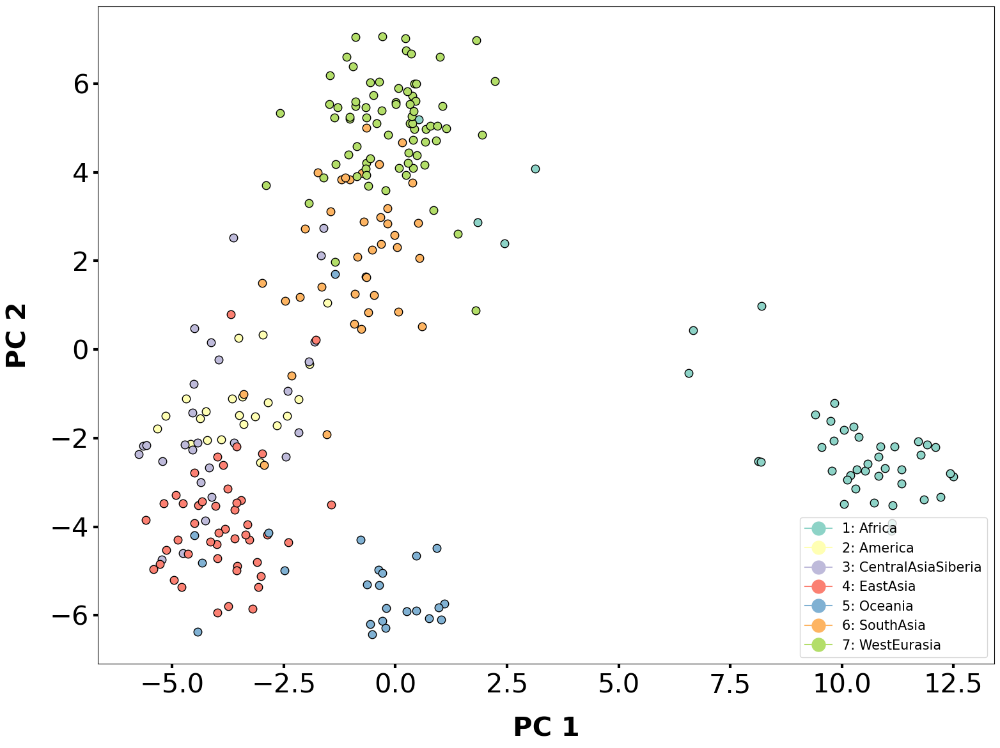

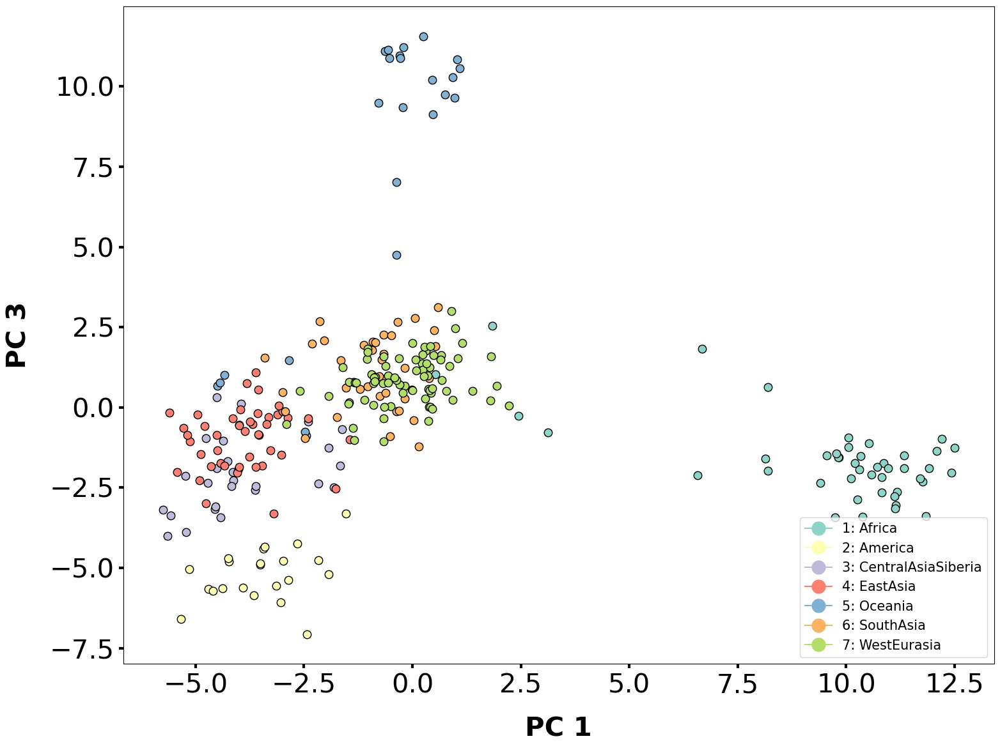

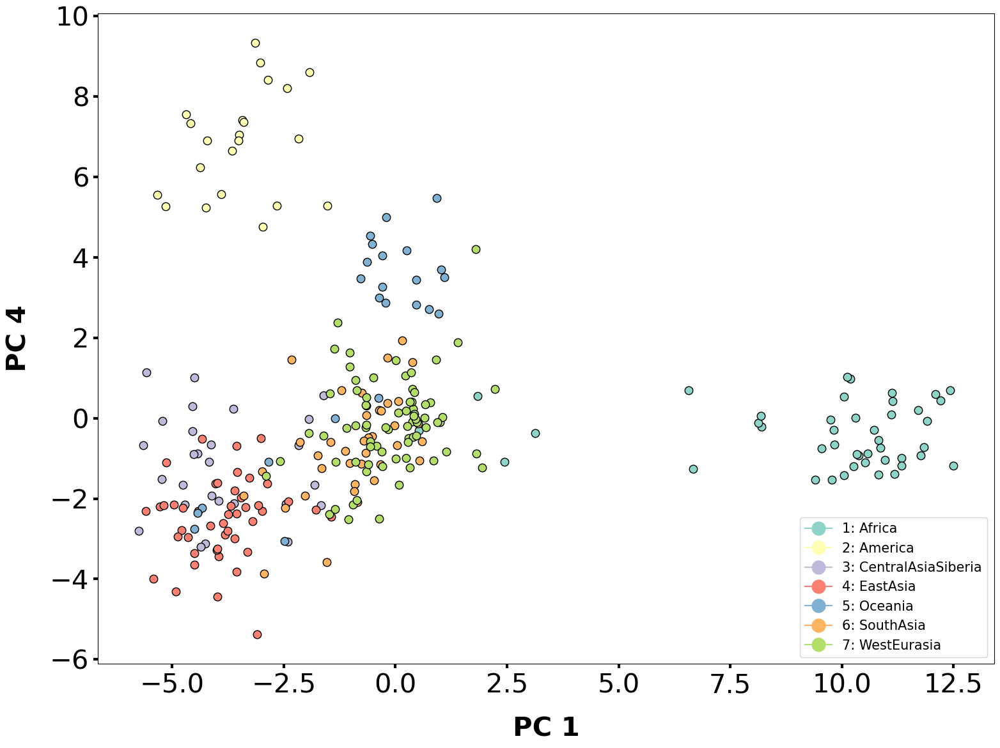

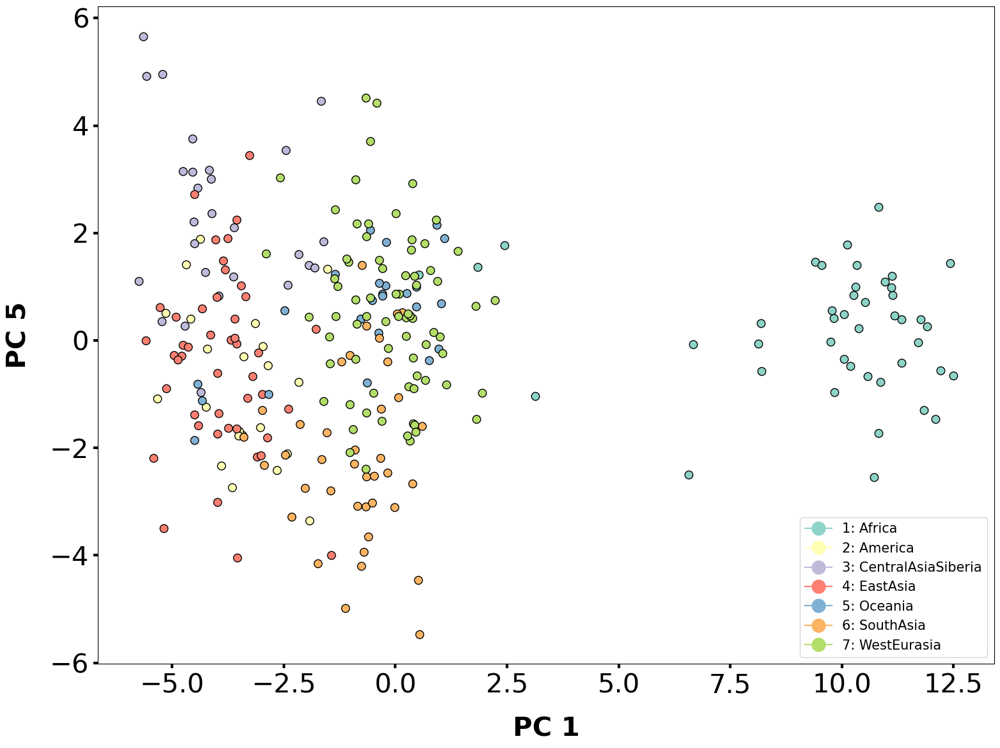

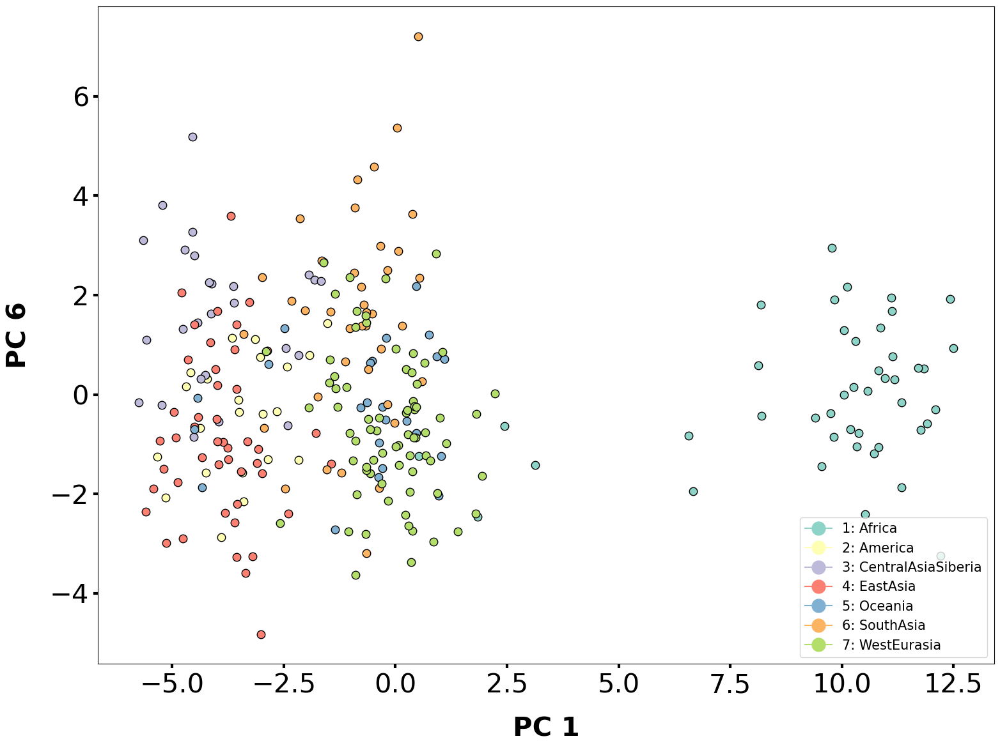

...

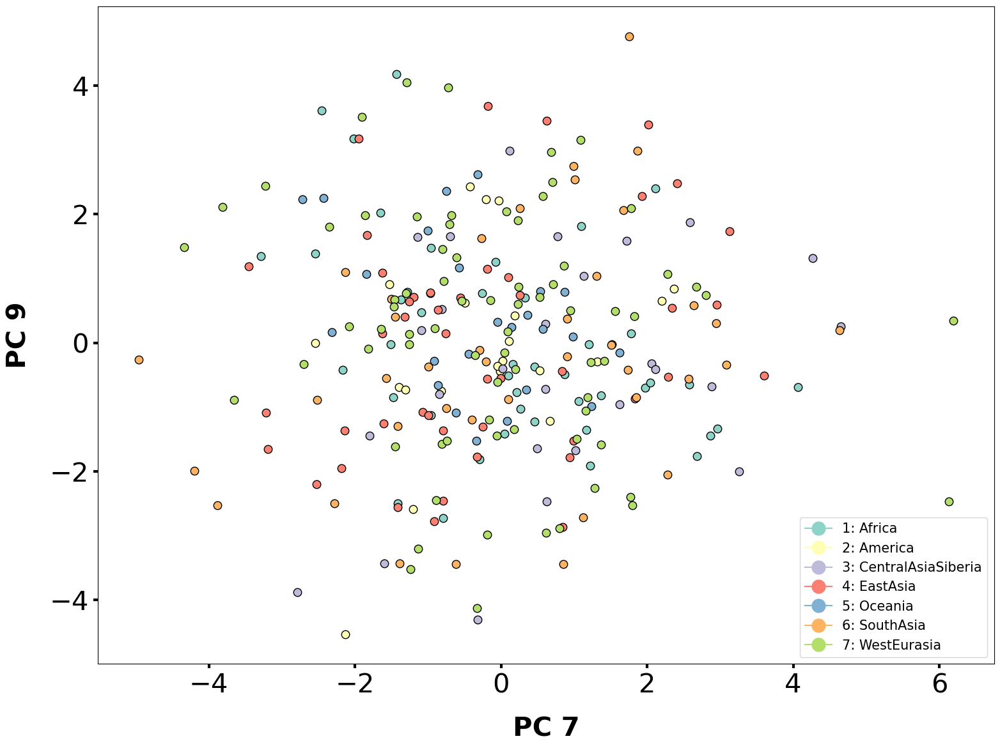

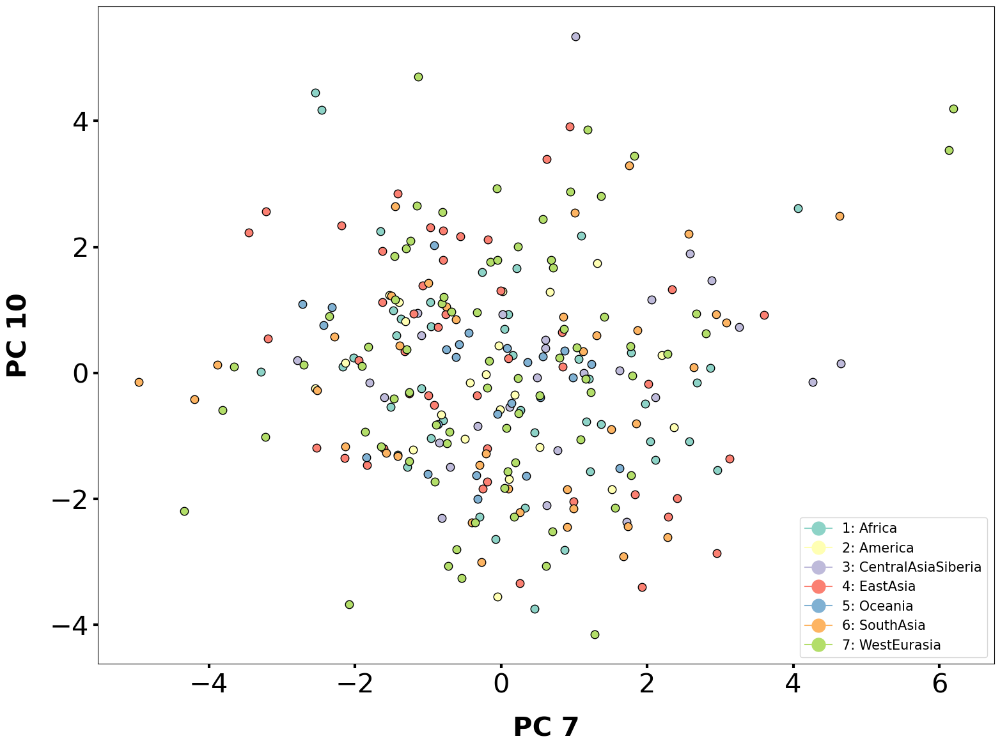

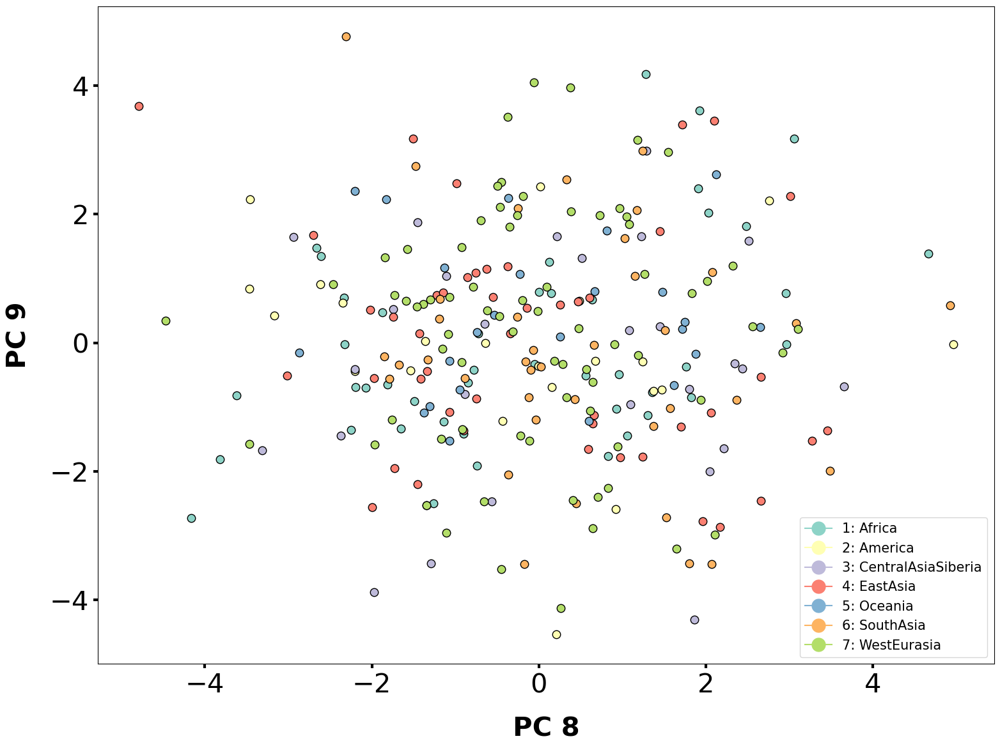

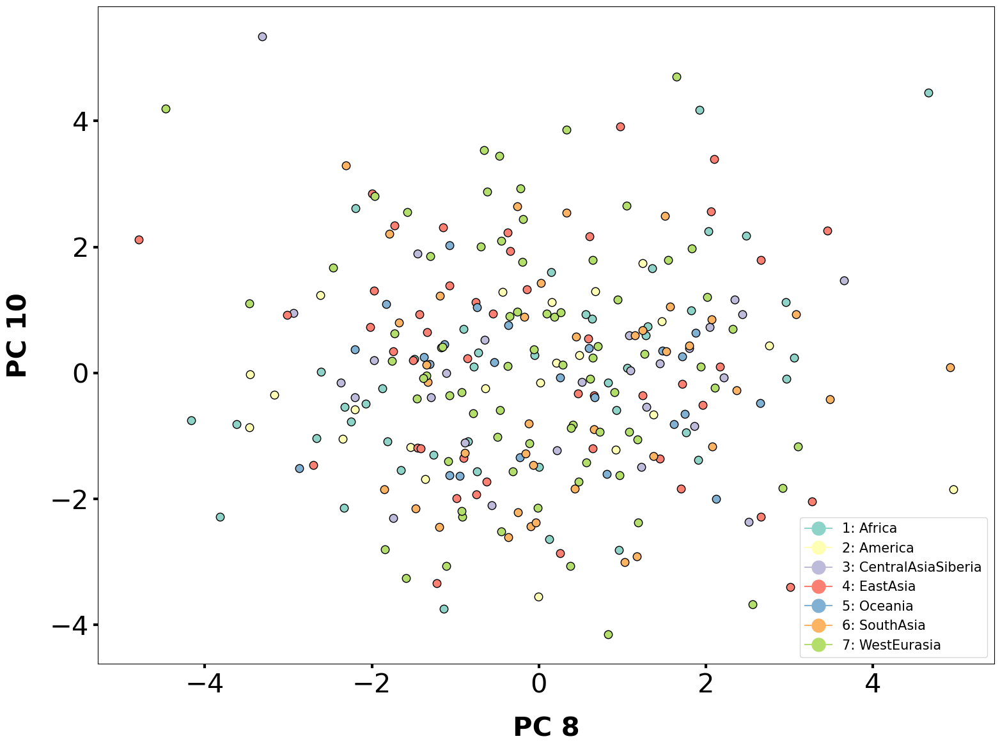

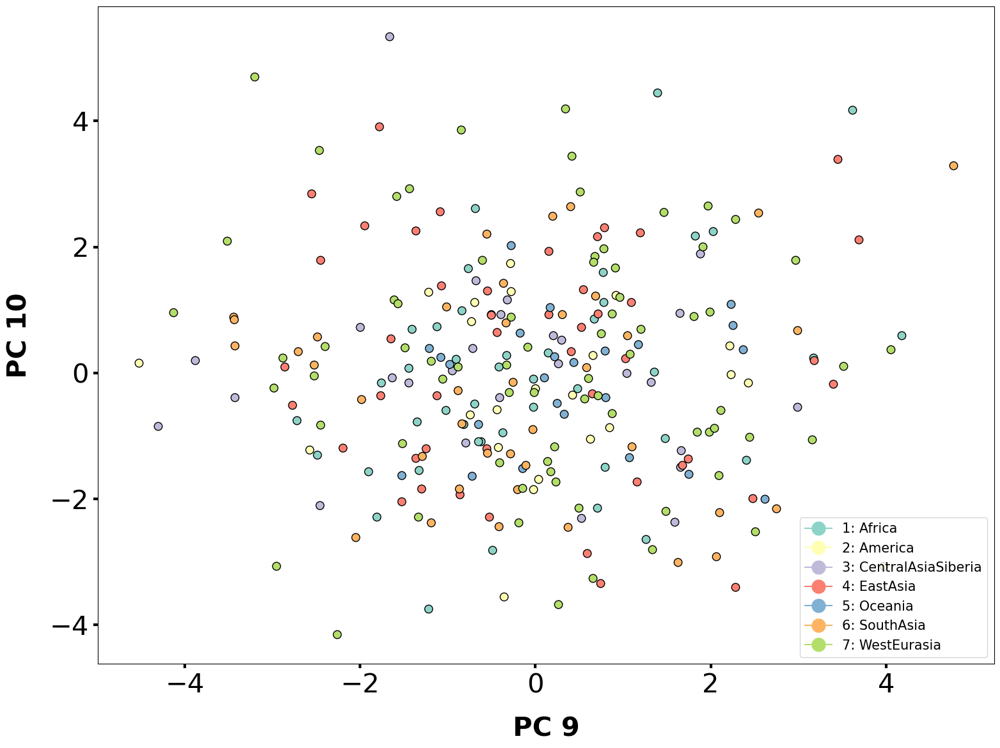

In [119]:
components = [1,2,3,4,5,6,7,8,9,10]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)    -0.892162     5.489106     0.074874   
Oceania            F    PapuaNewGuinea    -0.371671    -4.971423     4.744939   
America            F          Colombia    -3.902758    -2.037925    -5.618161   
WestEurasia        M            France    -0.494337     5.736979     0.032958   
WestEurasia        M    Italy(Bergamo)    -0.169527     4.847802     0.678178   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -3.405133    -1.684499    -4.350290   
Oceania            M         Australia     0.970935    -5.817219     9.643334   
Oceania            U         Australia    -0.367902    -5.317216     7.029370   
America            F            Mexico    -4.591960    -2.125209    -5.717858   
Africa             M        

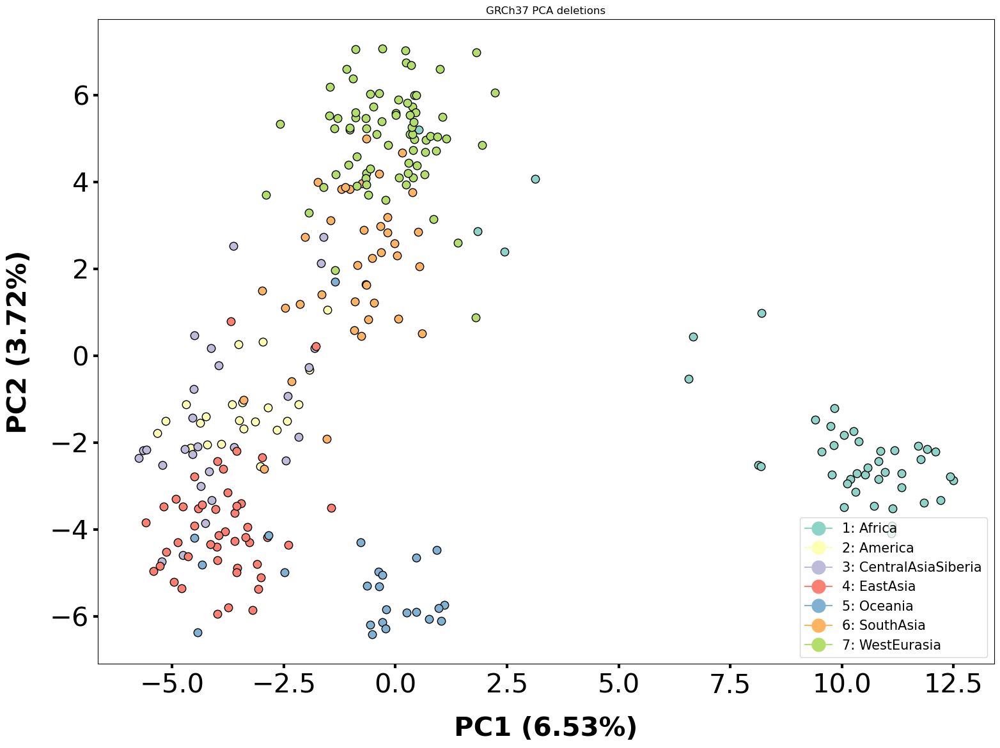

In [120]:
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (6.53%)', label_vertical='PC2 (3.72%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA deletions")

plt.savefig('../plots/grch37_pca_deletions_pc12.png', transparent=True)

            7-Gender        11-Country  component_1  component_2  component_3  \
10-Region                                                                       
WestEurasia        M  Russia(Caucasus)    -0.892162     5.489106     0.074874   
Oceania            F    PapuaNewGuinea    -0.371671    -4.971423     4.744939   
America            F          Colombia    -3.902758    -2.037925    -5.618161   
WestEurasia        M            France    -0.494337     5.736979     0.032958   
WestEurasia        M    Italy(Bergamo)    -0.169527     4.847802     0.678178   
...              ...               ...          ...          ...          ...   
America            M            Brazil    -3.405133    -1.684499    -4.350290   
Oceania            M         Australia     0.970935    -5.817219     9.643334   
Oceania            U         Australia    -0.367902    -5.317216     7.029370   
America            F            Mexico    -4.591960    -2.125209    -5.717858   
Africa             M        

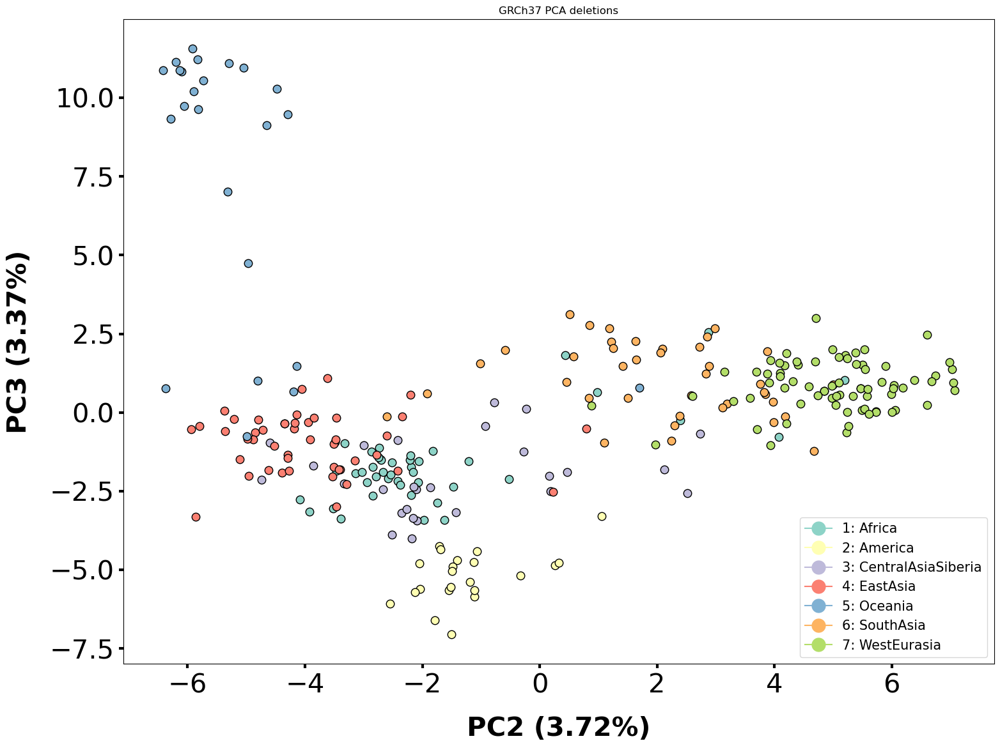

In [121]:
plot_scatter_cluster(data=df_pca, abscissa='component_2', ordinate='component_3', label_horizontal='PC2 (3.72%)', label_vertical='PC3 (3.37%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA deletions")

plt.savefig('../plots/grch37_pca_deletions_pc23.png', transparent=True)

<h1> Duplications

In [ ]:
cnv_passed_vst = cnvs.T.iloc[vst_dt_filtering_location.index]
#cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]<5).all(axis=1)]
cnv_passed_vst = cnv_passed_vst[(cnv_passed_vst[cnv_passed_vst.columns[1:]]>1).all(axis=1)]
counts = cnv_passed_vst.T
counts = counts.sort_index()
counts = counts.fillna(2)
counts = counts.sort_index()
counts


In [ ]:
features = anotation.merge(counts, left_index=True, right_index=True)
features = features.loc[:,["7-Gender","10-Region", "11-Country",]]
features = features.sort_index()
features 

In [ ]:
#PCA
pca = PCA(n_components=2)
pca_results = pca.fit_transform(counts)

df_pca= pd.DataFrame(pca_results,
                          columns=['component_1','component_2'
                                  ],
                          index=features.index)




df_pca = features.merge(df_pca, left_index=True, right_index=True)
df_pca

In [ ]:
components = [1,2,3,4,5]

combinations_components = list(combinations(components,2))
for i in combinations_components:
    plot_scatter_cluster(data=df_pca, abscissa='component_'+str(i[0]), ordinate='component_'+str(i[1]), label_horizontal='PC '+ str(i[0]), label_vertical='PC '+str(i[1]), factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
    #print(str(i[0]))

In [ ]:
pca.explained_variance_ratio_

In [ ]:
plot_scatter_cluster(data=df_pca, abscissa='component_1', ordinate='component_2', label_horizontal='PC1 (42.55%)', label_vertical='PC2 (24.61%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA duplications")

plt.savefig('../plots/grch37_pca_duplications_pc12.png', transparent=True)

In [ ]:
plot_scatter_cluster(data=df_pca, abscissa='component_2', ordinate='component_3', label_horizontal='PC2 (24.61%)', label_vertical='PC3 (15.99%)', factor='10-Region', fonts=define_font_properties(), colors=define_color_properties(), legend=True)
plt.title("GRCh37 PCA duplications")

plt.savefig('../plots/grch37_pca_duplications_pc23.png', transparent=True)

<h1> Dmean results 

In [ ]:
dmean_hg19 = pd.read_csv('dmean_hg19_results.csv')
dmean_hg19 = dmean_hg19.iloc[:,3:24]
dmean_hg19

In [ ]:
dmean_hg19_permutation = pd.read_csv('dmean_permutation_results.csv').set_index('Unnamed: 0')
dmean_hg19_permutation# = dmean_hg19_permutation.iloc[:,3:8655]

dmean_hg19_permutation.index.name = None
dmean_hg19_permutation

In [ ]:
filtering_dmean = pd.DataFrame(dmean_hg19.T)>=0.5
filtering_dmean = filtering_dmean.loc[:, filtering_dmean.any()]
#filtering_vst = filtering_vst.set_axis(combination_names)
filtering_dmean


In [ ]:
dmean_boolean = (dmean_hg19_permutation<=0.05)

dmean_boolean.columns = dmean_boolean.columns.astype(int) 

## Deleting columns where none of the regions passed the imputation
dmean_boolean = dmean_boolean.loc[:, dmean_boolean.any()]
dmean_boolean 



In [ ]:
# DMEAN RESULTS 
inner_vst = len(pd.concat([filtering_dmean.T, dmean_boolean.T],join='inner', axis=1))
left_vst = len(filtering_dmean.T) - inner_vst
right_vst = len(dmean_boolean.T) -inner_vst


venn2(subsets = (left_vst, right_vst, inner_vst), set_labels = ('Dmean', 'Permutation'))
plt.title('CNVs that passed Dmean and Permutation')
plt.show()

In [ ]:
passed_dmean_cnvs = pd.concat([filtering_dmean.T, dmean_boolean.T],join='inner', axis=1)
passed_dmean_cnvs

<h1> Overlapped CNVs that passed Vst and Dmean that also passed the permutation 

In [ ]:
vst_and_dmean_cnvs = pd.concat([filtering_vst.T, passed_dmean_cnvs],join='inner', axis=1)
vst_and_dmean_cnvs

In [ ]:
# DMEAN & VST RESULTS 
inner_vst = len(vst_and_dmean_cnvs)
left_vst = len(filtering_dmean.T) - inner_vst
right_vst = len(filtering_vst.T) -inner_vst


venn2(subsets = (left_vst, right_vst, inner_vst), set_labels = ('Dmean', 'Vst'))
plt.title('CNVs that overlap results from Vst and Dmean')
plt.show()

In [ ]:
input_liftover = candidates574.iloc[:,0:3]
input_liftover['chr'] = ('chr' + input_liftover['chr'])
input_liftover.to_csv('coordinates_574_candidates.bed', sep='\t', header=False, index=False)